In [2]:
#%pylab inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import imblearn
import hdbscan
#database genereator
from database_functions import *

In [3]:
# 2017 customers
data = db_generator(2017,range(1,13), '2018/01/01')

D:\Anaconda\lib\site-packages\pandas\core\frame.py:9190: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left,1 on the right)
  return merge(


In [4]:
data_2017 =  data.copy()

In [9]:
#All data
data_2018 = db_generator(2018,range(1,13), '2019/01/01')

In [10]:
len(data), len(data_2018)

(43713, 52749)

In [54]:
data_full = pd.concat([data, data_2018], axis=0)

In [6]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96456 entries, 0000f46a3911fa3c0805444483337064 to ffff5962728ec6157033ef9805bacc48
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   delay_max                       96456 non-null  float64
 1   delay_mean                      96456 non-null  float64
 2   delay_min                       96456 non-null  float64
 3   delay_std                       96456 non-null  float64
 4   duree_max                       96456 non-null  float64
 5   duree_mean                      96456 non-null  float64
 6   duree_min                       96456 non-null  float64
 7   duree_std                       96456 non-null  float64
 8   order_id_count                  96456 non-null  int64  
 9   nb_distinct_order_month         96456 non-null  int64  
 10  recence_min                     96456 non-null  int64  
 11  Product_count_max               96456 no

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43713 entries, 0000f46a3911fa3c0805444483337064 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   delay_max                       43713 non-null  float64
 1   delay_mean                      43713 non-null  float64
 2   delay_min                       43713 non-null  float64
 3   delay_std                       43713 non-null  float64
 4   duree_max                       43713 non-null  float64
 5   duree_mean                      43713 non-null  float64
 6   duree_min                       43713 non-null  float64
 7   duree_std                       43713 non-null  float64
 8   order_id_count                  43713 non-null  int64  
 9   nb_distinct_order_month         43713 non-null  int64  
 10  recence_min                     43713 non-null  int64  
 11  Product_count_max               43713 no

In [12]:
df=data.copy()

In [13]:
for col in df.select_dtypes(['object','uint8']).columns:
    df[col] =  df[col].astype('float')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43713 entries, 0000f46a3911fa3c0805444483337064 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   delay_max                       43713 non-null  float64
 1   delay_mean                      43713 non-null  float64
 2   delay_min                       43713 non-null  float64
 3   delay_std                       43713 non-null  float64
 4   duree_max                       43713 non-null  float64
 5   duree_mean                      43713 non-null  float64
 6   duree_min                       43713 non-null  float64
 7   duree_std                       43713 non-null  float64
 8   order_id_count                  43713 non-null  int64  
 9   nb_distinct_order_month         43713 non-null  int64  
 10  recence_min                     43713 non-null  int64  
 11  Product_count_max               43713 no

In [15]:
# Any NA values?
df.isna().sum()
# No

delay_max                         0
delay_mean                        0
delay_min                         0
delay_std                         0
duree_max                         0
duree_mean                        0
duree_min                         0
duree_std                         0
order_id_count                    0
nb_distinct_order_month           0
recence_min                       0
Product_count_max                 0
Product_count_mean                0
Product_count_min                 0
Product_count_std                 0
prct_fret_on_global_price_mean    0
product_category_name_max         0
product_category_name_mean        0
product_category_name_min         0
product_category_name_std         0
product_global_price_max          0
product_global_price_mean         0
product_global_price_min          0
(product_global_price, std)       0
last_order_value                  0
installment_1                     0
installment_10                    0
installment_2               

In [16]:
df.head()

,delay_max,delay_mean,delay_min,delay_std,duree_max,duree_mean,duree_min,duree_std,order_id_count,nb_distinct_order_month,...,last_order_value,installment_1,installment_10,installment_2,installment_3,installment_4,installment_5,installment_999,payment_value,review_score
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,27.0,27.0,27.0,0.0,0.0,0.0,0.0,0.0,1,1,...,86.22,0.0,0.0,0.0,0.0,0.0,0.0,1.0,86.22,3.0
0000f6ccb0745a6a4b88665a16c9f078,31.0,31.0,31.0,0.0,0.0,0.0,0.0,0.0,1,1,...,43.62,0.0,0.0,0.0,0.0,1.0,0.0,0.0,43.62,4.0
0004aac84e0df4da2b147fca70cf8255,20.0,20.0,20.0,0.0,0.0,0.0,0.0,0.0,1,1,...,196.89,0.0,0.0,0.0,0.0,0.0,0.0,1.0,196.89,5.0
0005e1862207bf6ccc02e4228effd9a0,32.0,32.0,32.0,0.0,0.0,0.0,0.0,0.0,1,1,...,150.12,0.0,0.0,0.0,1.0,0.0,0.0,0.0,150.12,4.0
0006fdc98a402fceb4eb0ee528f6a8d4,27.0,27.0,27.0,0.0,0.0,0.0,0.0,0.0,1,1,...,29.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,29.00,3.0


In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
delay_max,43713.0,24.421865,7.811839,7.00,20.000000,23.000000,29.000000,146.000000
delay_mean,43713.0,24.337681,7.723688,7.00,20.000000,23.000000,28.000000,146.000000
delay_min,43713.0,24.253655,7.715133,7.00,20.000000,23.000000,28.000000,146.000000
delay_std,43713.0,0.115232,1.085254,0.00,0.000000,0.000000,0.000000,78.488853
duree_max,43713.0,1.229200,13.043161,0.00,0.000000,0.000000,0.000000,311.000000
duree_mean,43713.0,1.181416,12.743609,0.00,0.000000,0.000000,0.000000,311.000000
duree_min,43713.0,1.136275,12.617132,0.00,0.000000,0.000000,0.000000,311.000000
duree_std,43713.0,0.061552,1.975393,0.00,0.000000,0.000000,0.000000,146.371104
order_id_count,43713.0,1.031753,0.198821,1.00,1.000000,1.000000,1.000000,10.000000
nb_distinct_order_month,43713.0,1.014298,0.127811,1.00,1.000000,1.000000,1.000000,7.000000


In [18]:
df.corr()

,delay_max,delay_mean,delay_min,delay_std,duree_max,duree_mean,duree_min,duree_std,order_id_count,nb_distinct_order_month,...,last_order_value,installment_1,installment_10,installment_2,installment_3,installment_4,installment_5,installment_999,payment_value,review_score
delay_max,1.000000,0.994893,0.979595,0.161913,0.047635,0.046391,0.044588,0.019498,0.071606,0.043450,...,0.080451,-0.050446,0.045880,-0.027156,-0.002119,0.017485,0.016225,0.049857,0.081688,-0.048664
delay_mean,0.994893,1.000000,0.994833,0.062222,0.004821,0.004863,0.004837,0.000661,0.010089,-0.003876,...,0.082122,-0.049945,0.045156,-0.026575,-0.001875,0.017682,0.016625,0.048315,0.075431,-0.049634
delay_min,0.979595,0.994833,1.000000,-0.038848,-0.037909,-0.036701,-0.035087,-0.017135,-0.051603,-0.050101,...,0.082969,-0.048854,0.043926,-0.025767,-0.001643,0.017733,0.016897,0.046192,0.068405,-0.050098
delay_std,0.161913,0.062222,-0.038848,1.000000,0.417442,0.411111,0.399741,0.134742,0.577239,0.434353,...,-0.007208,-0.010949,0.012217,-0.008293,-0.002406,-0.000423,-0.002113,0.020993,0.067348,0.003207
duree_max,0.047635,0.004821,-0.037909,0.417442,1.000000,0.993381,0.974586,0.254964,0.517702,0.752935,...,-0.006429,-0.007721,0.012427,-0.004600,-0.001456,0.001997,0.006952,0.001465,0.062425,0.010862
duree_mean,0.046391,0.004863,-0.036701,0.411111,0.993381,1.000000,0.993757,0.144224,0.485867,0.726866,...,-0.006350,-0.006796,0.011885,-0.004905,-0.001583,0.002020,0.006907,0.000793,0.058607,0.010511
duree_min,0.044588,0.004837,-0.035087,0.399741,0.974586,0.993757,1.000000,0.033431,0.449741,0.692532,...,-0.006197,-0.005918,0.011300,-0.005202,-0.001753,0.001978,0.006785,0.000428,0.054409,0.010023
duree_std,0.019498,0.000661,-0.017135,0.134742,0.254964,0.144224,0.033431,1.000000,0.345946,0.350677,...,-0.001764,-0.008508,0.005805,0.002532,0.001539,0.000556,0.001674,0.003415,0.041111,0.004652
order_id_count,0.071606,0.010089,-0.051603,0.577239,0.517702,0.485867,0.449741,0.345946,1.000000,0.708645,...,-0.014400,-0.014705,0.016139,-0.008666,0.001788,0.002037,-0.000653,0.018617,0.104737,0.007656
nb_distinct_order_month,0.043450,-0.003876,-0.050101,0.434353,0.752935,0.726866,0.692532,0.350677,0.708645,1.000000,...,-0.006769,-0.005185,0.012641,-0.006311,-0.000333,0.001971,0.001795,0.002713,0.084497,0.016235


In [19]:
matcor = df.corr()

In [20]:
# Max correlation value for each variable
abs(matcor.replace(1,np.nan)).max().sort_values(ascending=False)

Product_count_mean                0.997778
Product_count_max                 0.997778
product_global_price_mean         0.997551
product_global_price_max          0.997551
product_global_price_min          0.996606
delay_max                         0.994893
delay_mean                        0.994893
delay_min                         0.994833
duree_mean                        0.993757
duree_min                         0.993757
duree_max                         0.993381
product_category_name_max         0.990378
product_category_name_mean        0.990378
Product_count_min                 0.980254
product_category_name_min         0.964162
payment_value                     0.959533
last_order_value                  0.909782
nb_distinct_order_month           0.752935
order_id_count                    0.708645
delay_std                         0.577239
(product_global_price, std)       0.440984
prct_fret_on_global_price_mean    0.408076
Product_count_std                 0.396607
product_cat

#### Data Exploration on reduced data (Recence, Frequence, Cumulate order Amount, Distinct months)

In [48]:
df_red_v = df.loc[:,['recence_min','order_id_count','payment_value','delay_mean','installment_1','installment_2',
                     'installment_3','installment_4','installment_5','installment_10','installment_999','product_category_name_mean','Product_count_mean','prct_fret_on_global_price_mean', 'review_score']]

In [49]:
df_red_v.describe()

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
count,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000
mean,137.268090,1.031753,168.476298,24.337681,0.475038,0.119050,0.108494,0.074596,0.056813,0.066391,0.109769,1.007450,1.139355,0.205038,4.068323
std,95.680116,0.198821,246.369544,7.723688,0.498189,0.322553,0.309480,0.261334,0.230274,0.247394,0.310826,0.085578,0.529895,0.124942,1.346323
min,0.000000,1.000000,10.070000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
25%,47.000000,1.000000,63.100000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.115436,4.000000
50%,123.000000,1.000000,106.690000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.181946,5.000000
75%,213.000000,1.000000,183.730000,28.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.269114,5.000000
max,360.000000,10.000000,13664.080000,146.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,21.000000,0.851621,5.000000


In [50]:
#some checking
df_red_v[df_red_v['order_id_count']==10]

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
customer_unique_id,,,,,,,,,,,,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,39,10,503.54,15.9,0.7,0.1,0.2,0.0,0.0,0.0,0.0,1.0,1.0,0.258333,4.6


In [51]:
#df_red_v = df.loc[:,['recence_min','order_id_count','payment_value','nb_distinct_order_month']]
#df_red_v.loc[:,'payment_value'] = np.log(df_red['payment_value'])

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


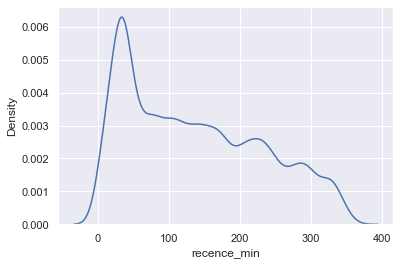

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


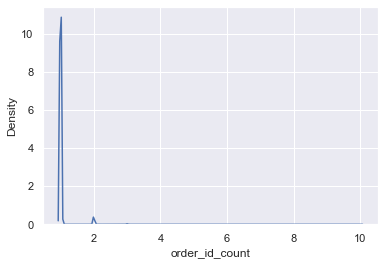

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


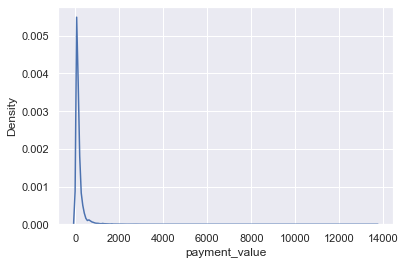

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


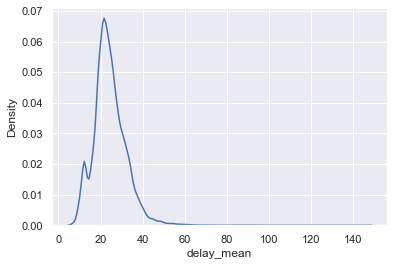

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


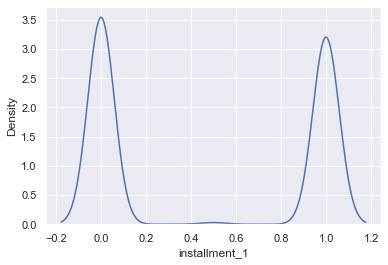

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


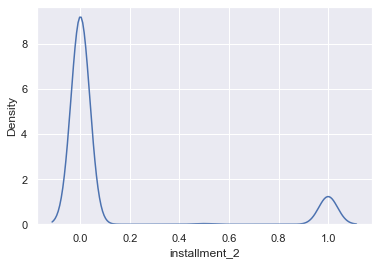

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


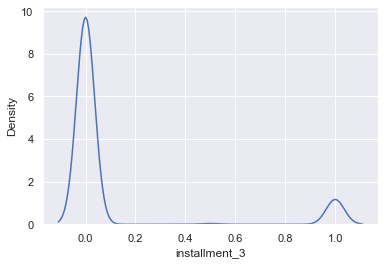

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


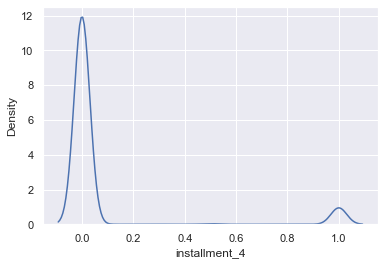

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


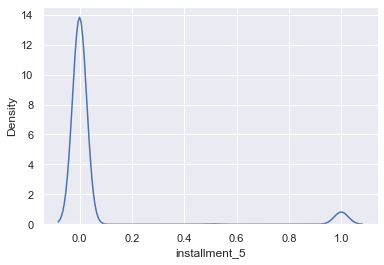

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


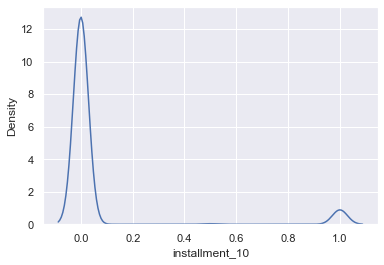

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


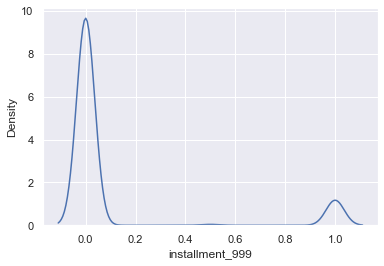

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


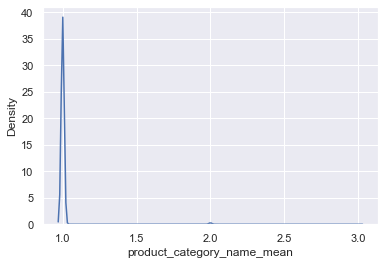

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


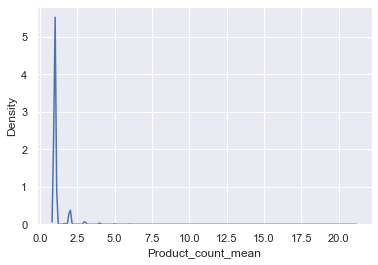

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


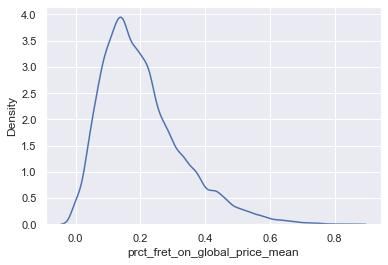

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


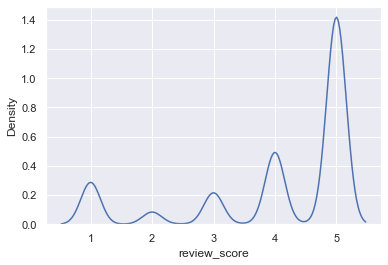

In [52]:
for col in df_red_v.columns:
    plt.figure()
    sns.distplot(df_red_v[col], hist = False)
    plt.show()

In [53]:
from IPython.display import display
for col in df_red_v.columns:
    print(col)
    display(
        pd.DataFrame({'Freq':df_red_v[col].value_counts(),'Proportion':df_red_v[col].value_counts(normalize=True)*100}),
    )
    print('\n')

recence_min


,Freq,Proportion
37,1153,2.637659
36,488,1.116373
34,398,0.910484
35,384,0.878457
33,373,0.853293
...,...,...
355,6,0.013726
356,5,0.011438
357,5,0.011438
358,4,0.009151




order_id_count


,Freq,Proportion
1,42457,97.126713
2,1156,2.644522
3,80,0.183012
4,14,0.032027
5,4,0.009151
6,1,0.002288
10,1,0.002288




payment_value


,Freq,Proportion
77.57,238,0.544460
73.34,144,0.329421
35.00,110,0.251641
116.94,102,0.233340
107.78,95,0.217327
...,...,...
69.83,1,0.002288
945.88,1,0.002288
308.28,1,0.002288
614.49,1,0.002288




delay_mean


,Freq,Proportion
21.00,3195,7.309039
22.00,2862,6.547251
23.00,2822,6.455745
19.00,2666,6.098872
24.00,2572,5.883833
...,...,...
101.00,1,0.002288
78.00,1,0.002288
15.90,1,0.002288
97.00,1,0.002288




installment_1


,Freq,Proportion
0.000000,22841,52.252190
1.000000,20661,47.265116
0.500000,191,0.436941
0.333333,10,0.022876
0.666667,5,0.011438
0.250000,2,0.004575
0.200000,1,0.002288
0.700000,1,0.002288
0.750000,1,0.002288




installment_2


,Freq,Proportion
0.000000,38432,87.918926
1.000000,5131,11.737927
0.500000,132,0.301970
0.333333,8,0.018301
0.666667,5,0.011438
0.250000,3,0.006863
0.200000,1,0.002288
0.100000,1,0.002288




installment_3


,Freq,Proportion
0.000000,38885,88.955231
1.000000,4660,10.660444
0.500000,151,0.345435
0.333333,8,0.018301
0.666667,5,0.011438
0.250000,2,0.004575
0.400000,1,0.002288
0.200000,1,0.002288




installment_4


,Freq,Proportion
0.000000,40384,92.384417
1.000000,3198,7.315901
0.500000,116,0.265367
0.333333,13,0.029739
0.250000,2,0.004575




installment_5


,Freq,Proportion
0.000000,41178,94.200810
1.000000,2435,5.570425
0.500000,87,0.199025
0.333333,6,0.013726
0.250000,3,0.006863
0.666667,3,0.006863
0.200000,1,0.002288




installment_10


,Freq,Proportion
0.000000,40738,93.194244
1.000000,2835,6.485485
0.500000,117,0.267655
0.333333,12,0.027452
0.250000,6,0.013726
0.666667,3,0.006863
0.750000,1,0.002288
0.400000,1,0.002288




installment_999


,Freq,Proportion
0.000000,38814,88.792808
1.000000,4701,10.754238
0.500000,170,0.388900
0.333333,15,0.034315
0.666667,6,0.013726
0.750000,3,0.006863
0.250000,2,0.004575
0.200000,1,0.002288
0.400000,1,0.002288




product_category_name_mean


,Freq,Proportion
1.000000,43376,99.229062
2.000000,292,0.667994
1.666667,20,0.045753
1.750000,10,0.022876
1.500000,4,0.009151
1.400000,2,0.004575
3.000000,2,0.004575
1.250000,1,0.002288
1.333333,1,0.002288
1.571429,1,0.002288




Product_count_mean


,Freq,Proportion
1.000000,39330,89.973235
2.000000,3176,7.265573
3.000000,540,1.235330
4.000000,232,0.530735
1.666667,162,0.370599
5.000000,85,0.194450
6.000000,65,0.148697
2.500000,41,0.093794
1.500000,13,0.029739
3.400000,9,0.020589




prct_fret_on_global_price_mean


,Freq,Proportion
0.000000,498,1.139249
0.227794,308,0.704596
0.183256,178,0.407202
0.431429,112,0.256217
0.165893,101,0.231053
...,...,...
0.170874,1,0.002288
0.172648,1,0.002288
0.068306,1,0.002288
0.087717,1,0.002288




review_score


,Freq,Proportion
5.000000,24694,56.491204
4.000000,8573,19.612015
1.000000,4998,11.433670
3.000000,3752,8.583259
2.000000,1459,3.337680
4.500000,104,0.237915
3.500000,54,0.123533
2.500000,33,0.075492
4.333333,10,0.022876
3.666667,8,0.018301


In [60]:
df_red_v[df_red_v.columns].describe(include='all')

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
count,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000,43713.000000
mean,137.268090,1.031753,168.476298,24.337681,0.475038,0.119050,0.108494,0.074596,0.056813,0.066391,0.109769,1.007450,1.139355,0.205038,4.068323
std,95.680116,0.198821,246.369544,7.723688,0.498189,0.322553,0.309480,0.261334,0.230274,0.247394,0.310826,0.085578,0.529895,0.124942,1.346323
min,0.000000,1.000000,10.070000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
25%,47.000000,1.000000,63.100000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.115436,4.000000
50%,123.000000,1.000000,106.690000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.181946,5.000000
75%,213.000000,1.000000,183.730000,28.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.269114,5.000000
max,360.000000,10.000000,13664.080000,146.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,21.000000,0.851621,5.000000


In [61]:
from IPython.display import display
for col in df_red_v.columns:
    print(col)
    display(
        pd.DataFrame({'Freq':data_full[col].value_counts(),'Proportion':data_full[col].value_counts(normalize=True)*100}),
    )
    print('\n')

recence_min


,Freq,Proportion
37,1153,1.195289
146,515,0.533889
229,498,0.516265
230,497,0.515229
36,488,0.505899
...,...,...
99,86,0.089154
64,83,0.086044
0,74,0.076714
364,72,0.074641




order_id_count


,Freq,Proportion
1,94039,97.488130
2,2247,2.329415
3,144,0.149282
4,22,0.022807
5,6,0.006220
6,2,0.002073
10,1,0.001037
7,1,0.001037




payment_value


,Freq,Proportion
77.57,246,0.255023
35.00,165,0.171052
73.34,151,0.156538
116.94,127,0.131658
65.00,113,0.117145
...,...,...
407.05,1,0.001037
939.90,1,0.001037
337.59,1,0.001037
54.83,1,0.001037




delay_mean


,Freq,Proportion
21.000000,5768,5.979557
22.000000,5399,5.597023
23.000000,5293,5.487135
24.000000,5058,5.243516
25.000000,4681,4.852688
...,...,...
32.800000,1,0.001037
34.666667,1,0.001037
38.333333,1,0.001037
26.750000,1,0.001037




installment_1


,Freq,Proportion
0.000000,48562,50.343140
1.000000,47474,49.215235
0.500000,390,0.404304
0.333333,17,0.017624
0.666667,12,0.012440
0.250000,2,0.002073
0.750000,2,0.002073
0.200000,1,0.001037
0.700000,1,0.001037
0.857143,1,0.001037




installment_2


,Freq,Proportion
0.000000,84231,87.320396
1.000000,11932,12.369638
0.500000,265,0.274720
0.333333,21,0.021770
0.666667,6,0.006220
0.250000,3,0.003110
0.200000,1,0.001037
0.100000,1,0.001037
0.142857,1,0.001037
0.400000,1,0.001037




installment_3


,Freq,Proportion
0.000000,86187,89.348137
1.000000,9976,10.341896
0.500000,268,0.277830
0.333333,16,0.016587
0.666667,8,0.008293
0.250000,3,0.003110
0.400000,2,0.002073
0.200000,2,0.002073




installment_4


,Freq,Proportion
0.000000,89468,92.749476
1.000000,6775,7.023491
0.500000,197,0.204225
0.333333,19,0.019697
0.250000,2,0.002073
0.200000,1,0.001037




installment_5


,Freq,Proportion
0.000000,91301,94.649707
1.000000,4965,5.147105
0.500000,176,0.182455
0.333333,8,0.008293
0.666667,5,0.005183
0.250000,4,0.004147
0.200000,1,0.001037
0.400000,1,0.001037
0.750000,1,0.001037




installment_10


,Freq,Proportion
0.000000,91273,94.620680
1.000000,4967,5.149178
0.500000,189,0.195932
0.333333,17,0.017624
0.250000,7,0.007257
0.666667,6,0.006220
0.750000,1,0.001037
0.400000,1,0.001037
0.200000,1,0.001037




installment_999


,Freq,Proportion
0.000000,85904,89.054757
1.000000,10225,10.600029
0.500000,294,0.304783
0.333333,21,0.021770
0.666667,10,0.010367
0.750000,3,0.003110
0.250000,2,0.002073
0.200000,2,0.002073
0.400000,1,0.001037




product_category_name_mean


,Freq,Proportion
1.000000,95683,99.192428
2.000000,689,0.714271
1.666667,37,0.038357
1.750000,15,0.015550
3.000000,14,0.014513
1.800000,4,0.004147
1.400000,4,0.004147
1.500000,4,0.004147
2.500000,2,0.002073
1.600000,2,0.002073




Product_count_mean


,Freq,Proportion
1.000000,86815,89.999171
2.000000,7055,7.313761
3.000000,1193,1.236756
4.000000,459,0.475835
1.666667,313,0.324480
5.000000,194,0.201115
6.000000,178,0.184529
2.500000,80,0.082934
1.500000,21,0.021770
3.400000,21,0.021770




prct_fret_on_global_price_mean


,Freq,Proportion
0,672,0.696647
0.0,335,0.347287
0.22779425035451853,318,0.329663
0.18325606763021543,185,0.191785
0.43142857142857144,169,0.175199
...,...,...
0.069830136463403,1,0.001037
0.10133100165160788,1,0.001037
0.20326727370112477,1,0.001037
0.09549892831626577,1,0.001037




review_score


,Freq,Proportion
5.000000,55088,57.108499
4.000000,18507,19.185793
1.000000,11251,11.663660
3.000000,8038,8.332815
2.000000,3117,3.231324
4.500000,212,0.219776
3.500000,109,0.112998
2.500000,66,0.068421
4.333333,15,0.015550
1.500000,15,0.015550


In [62]:
from IPython.display import display
data_full[df_red_v.columns].describe(include='all')

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
count,96462.000000,96462.000000,96462.000000,96462.000000,96462.000000,96462.000000,96462.000000,96462.000000,96462.00000,96462.000000,96462.000000,96462.000000,96462.000000,96462,96462.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44943,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,672,NaN
mean,197.129502,1.027472,167.607116,23.285330,0.494355,0.125201,0.104939,0.071329,0.05247,0.052604,0.107703,1.007983,1.140095,NaN,4.072218
std,98.694266,0.182456,239.106309,8.602765,0.498879,0.329796,0.305227,0.256285,0.22185,0.221979,0.308634,0.089857,0.532175,NaN,1.353513
min,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,NaN,1.000000
25%,133.000000,1.000000,63.050000,18.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,NaN,4.000000
50%,203.000000,1.000000,107.840000,23.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,NaN,5.000000
75%,280.000000,1.000000,183.430000,28.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,1.000000,NaN,5.000000


In [63]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
sc_red = MinMaxScaler()
df_scaled = pd.DataFrame(data = sc_red.fit_transform(df_red_v),
                         columns=df_red_v.columns)
df_scaled

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
0,0.822222,0.0,0.005577,0.143885,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.234519,0.50
1,0.222222,0.0,0.002457,0.172662,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.00,0.474592,0.75
2,0.130556,0.0,0.013682,0.093525,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.100730,1.00
3,0.838889,0.0,0.010257,0.179856,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.118268,0.75
4,0.461111,0.0,0.001386,0.143885,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.611410,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43708,0.011111,0.0,0.011517,0.179856,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.128568,1.00
43709,0.572222,0.0,0.150677,0.338129,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.05,0.284813,1.00
43710,0.058333,0.0,0.005457,0.179856,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.273358,0.75
43711,0.908333,0.0,0.007499,0.266187,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.235556,1.00


D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


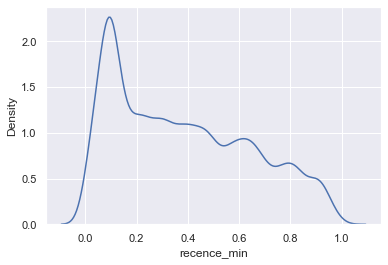

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


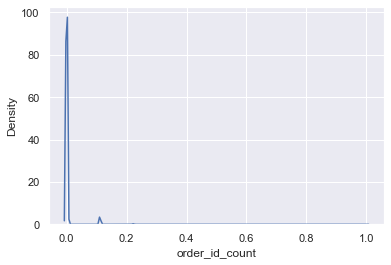

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


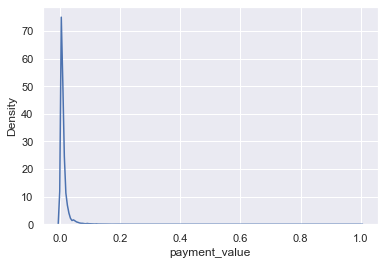

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


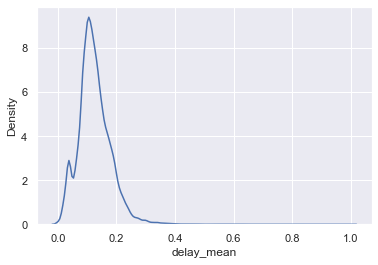

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


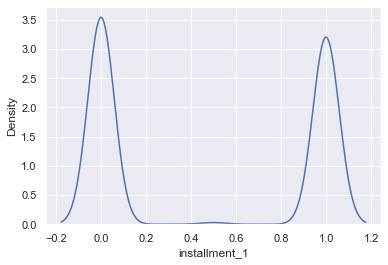

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


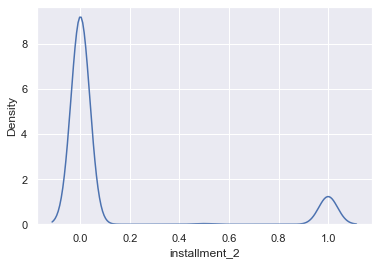

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


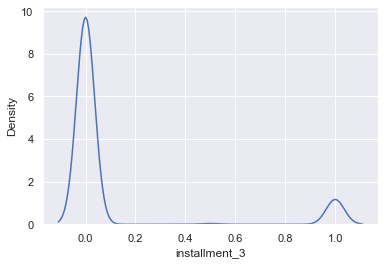

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


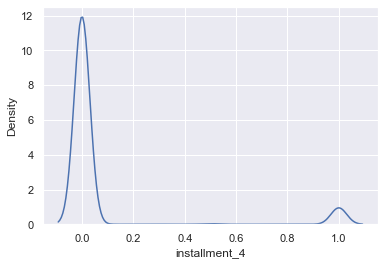

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


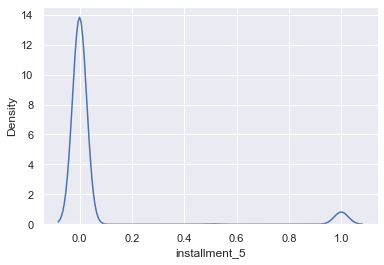

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


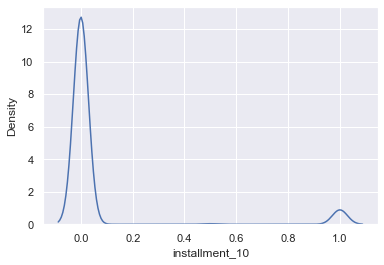

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


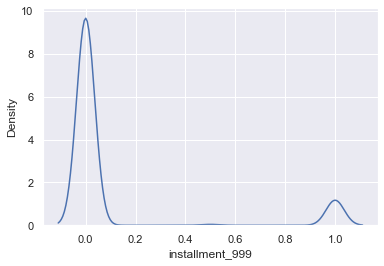

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


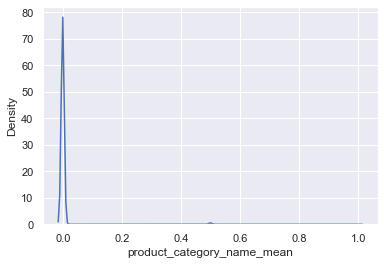

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


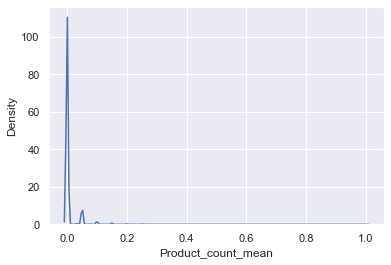

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


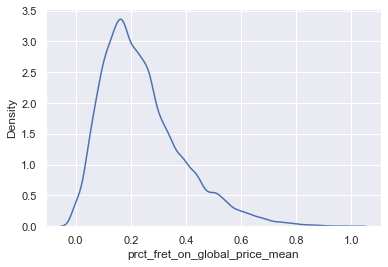

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


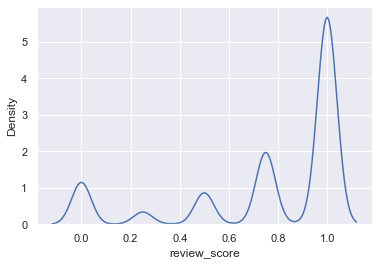

In [64]:
for col in df_scaled.columns:
    plt.figure()
    sns.distplot(df_scaled[col], hist = False)
    plt.show()

In [65]:
from sklearn.decomposition import PCA
pca = PCA()

In [66]:
df_pca = pca.fit_transform(df_scaled)

In [67]:
pca.explained_variance_ratio_*100

array([3.12114886e+01, 1.22881564e+01, 1.20438443e+01, 1.15134210e+01,
       8.88439432e+00, 7.53960524e+00, 7.34562325e+00, 6.24866905e+00,
       2.12313945e+00, 3.04885237e-01, 1.98758750e-01, 1.51158848e-01,
       7.05786951e-02, 5.20229038e-02, 2.42539193e-02])

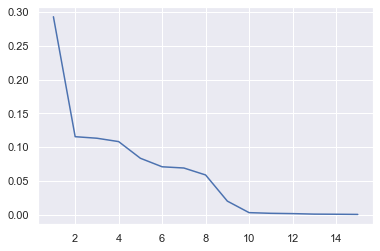

In [68]:
plt.figure()
plt.plot(range(1,16), pca.explained_variance_)

In [69]:
### Notes: tere are somes correlated features groups, let's see that

<AxesSubplot:>

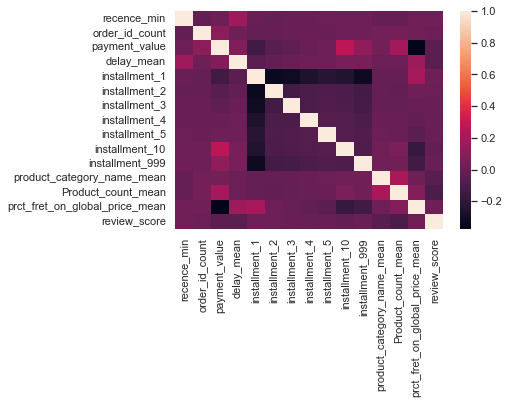

In [70]:
sns.heatmap(df_scaled.corr())

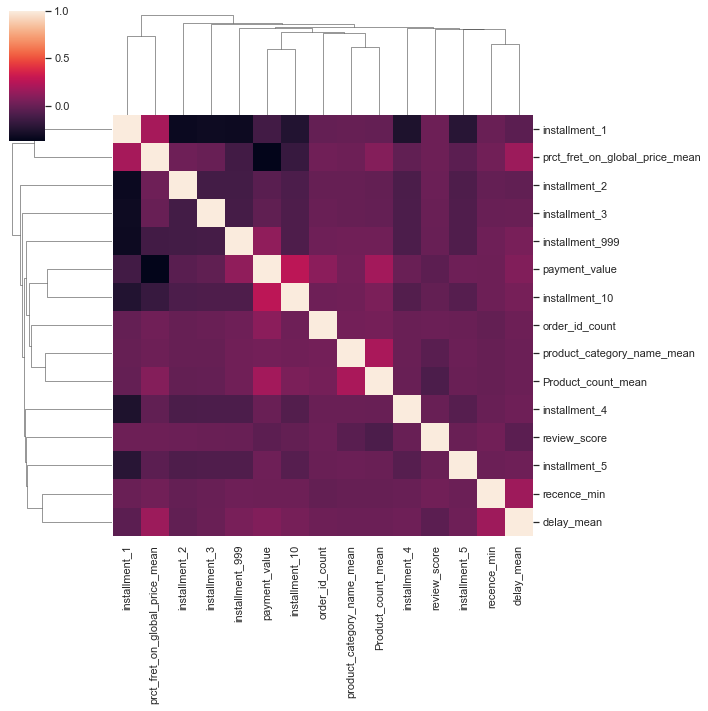

In [71]:
sns.clustermap(df_scaled.corr())

In [72]:
### Notes it will be insteresting to see clustereing result on top 9 pca components

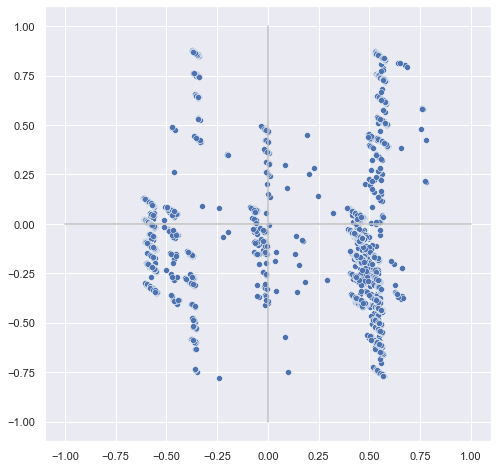

In [73]:
plt.figure(figsize=(8,8))
sns.scatterplot(x= df_pca[:,0], y = df_pca[:,1])
plt.plot([-1,+1],[0,0],color='silver',linestyle='-')
plt.plot([0,0],[-1,+1],color='silver',linestyle='-')
plt.show()

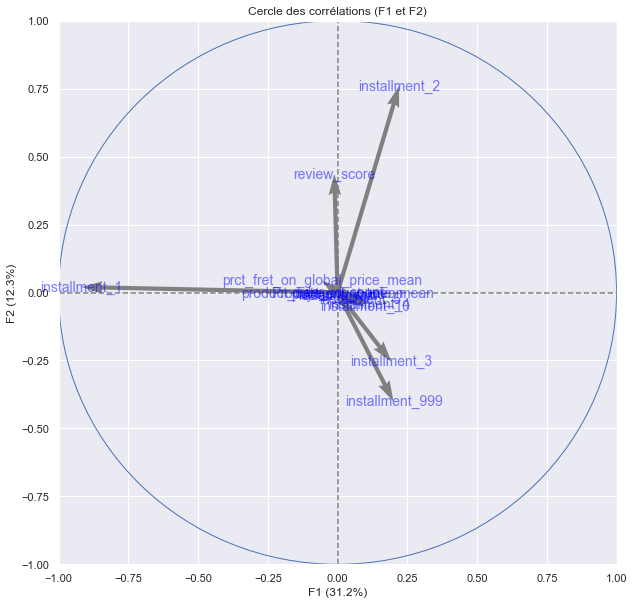

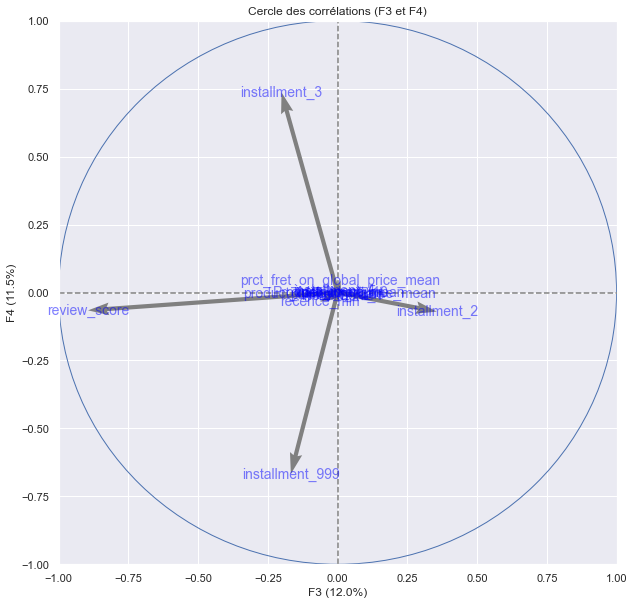

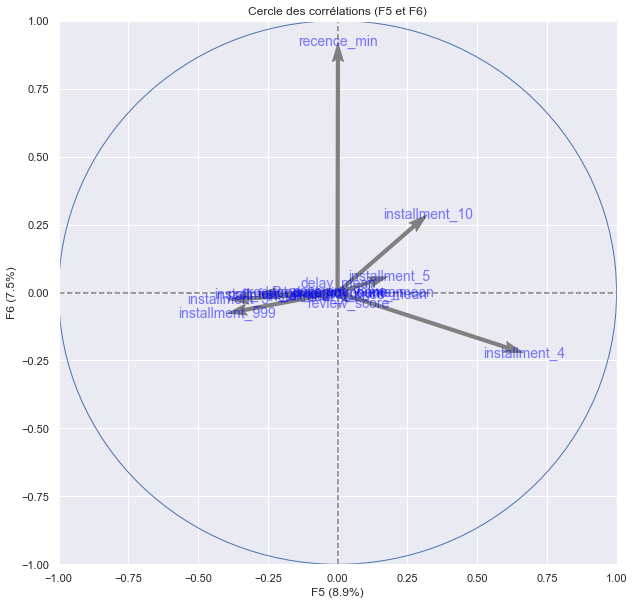

In [74]:
from functions import *
# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, 6, pca, [(0,1),(2,3), (4,5)], labels = df_scaled.columns, size=(10,10))

#### Notes : the graph looks like scatterpot b/w continous variable and categorical variable

#### Clustering on reduced data

In [75]:
from sklearn import cluster
#librairie pour évaluation des partitions
from sklearn import metrics
from sklearn.metrics.cluster import adjusted_rand_score
#utilisation de la métrique "silhouette"
#faire varier le nombre de clusters de 2 à 10

In [76]:
def checking(p,k,df):
    res = []
    davies_boulding = []
    elbow = []
    ARI = []
    MI = []
    homogeneity = []
    completness = []
    v_measure = []
    
    for k in np.arange(p,k):
        km1 = cluster.KMeans(n_clusters=k+2, random_state=42)
        km1.fit(df)
        res.append(
            metrics.silhouette_score(df,km1.labels_)
        )
        
        davies_boulding.append(
            metrics.davies_bouldin_score(df,km1.labels_)
        )
        

        elbow.append(
            km1.inertia_
        )

        km2 = cluster.KMeans(n_clusters=k+2, random_state=3)
        km2.fit(df)
        ARI.append(
            adjusted_rand_score(km1.labels_, km2.labels_)
        )

        MI.append(
            metrics.adjusted_mutual_info_score(km1.labels_, km2.labels_)
        )

        homogeneity.append(
            metrics.homogeneity_score(km1.labels_, km2.labels_)
        )

        completness.append(
                metrics.completeness_score(km1.labels_, km2.labels_)
        )

        v_measure.append(
                metrics.v_measure_score(km1.labels_, km2.labels_)
        )
    return res, davies_boulding, elbow, ARI, MI, homogeneity, completness, v_measure

def resultat_km(p,k,df):
    res, davies_boulding, elbow, ARI, MI, homogeneity, completness, v_measure =  checking(p,k,df)
    
    fig, axes = plt.subplots(1,3,figsize=(21,8))
    sns.lineplot(x = np.arange(p+2,k+2,1), y = res, ax = axes[0])
    sns.lineplot(x = np.arange(p+2,k+2,1), y = elbow, ax = axes[1] )
    sns.lineplot(x = np.arange(p+2,k+2,1), y = davies_boulding, ax = axes[2])
    axes[0].title.set_text('Shiloutette')
    axes[1].title.set_text('Elbow')
    axes[2].title.set_text('Davies Boulding')
    plt.show()
    
    print(res)

    
    print(davies_boulding)
    #graphique


    print(elbow)
    #graphique


    return pd.DataFrame({'homogeneity':homogeneity, 'completness':completness, 'v_measure':v_measure,'ARI':ARI,'MI':MI}, index=np.arange(p+2,k+2,1))  

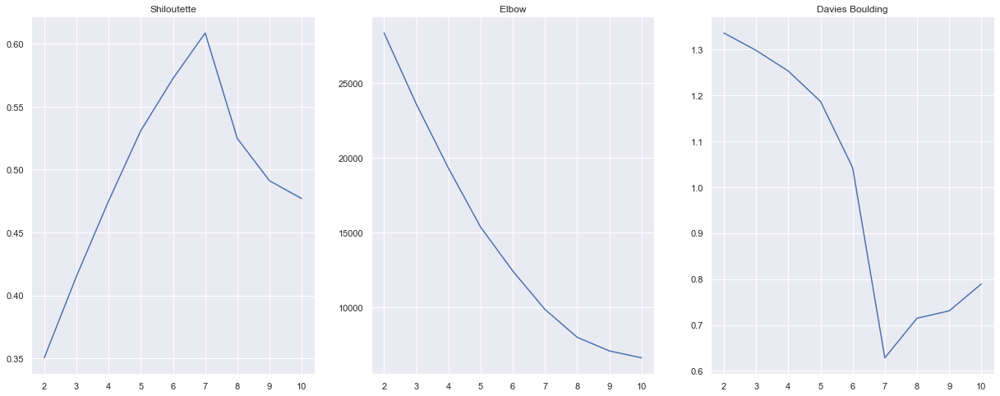

[0.35042330467848243, 0.41519465983652853, 0.47510333599599813, 0.5309369743960374, 0.5723413094988635, 0.6084830035046869, 0.5246575808488835, 0.4910765798323827, 0.4769466630020397]
[1.3353336167589147, 1.2975311925028086, 1.2525405173314723, 1.1865941180542676, 1.0423353975101406, 0.6284778843857926, 0.7147045059482422, 0.7306629070451789, 0.7893351840828371]
[28349.23838110799, 23606.293661031737, 19310.01929342252, 15371.205319106397, 12432.958340346928, 9865.46720804482, 8007.469301242354, 7094.177835016933, 6631.93436924514]


,homogeneity,completness,v_measure,ARI,MI
2,1.000000,1.000000,1.000000,1.000000,1.000000
3,1.000000,1.000000,1.000000,1.000000,1.000000
4,1.000000,1.000000,1.000000,1.000000,1.000000
5,0.913231,0.907846,0.910530,0.927874,0.910519
6,0.997739,0.997679,0.997709,0.999475,0.997709
7,0.992031,0.992292,0.992162,0.998063,0.992160
8,0.998282,0.998336,0.998309,0.999518,0.998309
9,0.994885,0.994661,0.994773,0.995778,0.994771
10,0.994576,0.994676,0.994626,0.996597,0.994624


In [77]:
#kmeans on non scaled data
resultat_km(0,9, df_scaled)

In [78]:
km2 = cluster.KMeans(n_clusters=2, random_state=42).fit(df_scaled)
km7 = cluster.KMeans(n_clusters=7, random_state=42).fit(df_scaled)
km7_prime = cluster.KMeans(n_clusters=7, random_state=3).fit(df_scaled)

In [79]:
#The best setting  is to keep 7 clusters (lowest davies-boulding index and highest shilouhette score)

#### According Silhouette score we havre to keep 7 clusters setting

In [80]:
pd.Series(km2.labels_).value_counts()

1    22978
0    20735
dtype: int64

In [81]:
pd.Series(km7.labels_).value_counts()

1    20289
3     5245
4     4773
2     4735
6     3272
5     2880
0     2519
dtype: int64

#### Clusters Visalisations

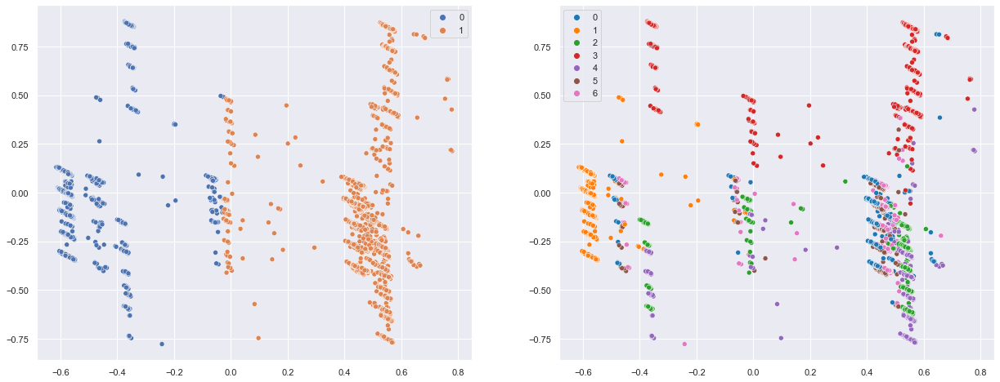

In [82]:
fig, axes = plt.subplots(1,2,figsize=(21,8))
sns.scatterplot(x= df_pca[:,0], y = df_pca[:,1], hue=km2.labels_, ax = axes[0])
sns.scatterplot(x= df_pca[:,0], y = df_pca[:,1], hue=km7.labels_, ax = axes[1], palette = 'tab10')
plt.show()

##### Notes : These 2 options seem credibale. let's look their consistence according orignal data (I mean df_red non-scaled)

#### CLUTSERS Visualisation

In [83]:
# Visaultion with tsne
from sklearn.manifold import TSNE
model1 = TSNE(n_components=2, perplexity=5, random_state=42, )
model2 = TSNE(n_components=2, perplexity=15, random_state=42, )
model3 = TSNE(n_components=2, perplexity=30, random_state=42, )
model4 = TSNE(n_components=2, perplexity=50, random_state=42, )
model5 = TSNE(n_components=2, perplexity=100, random_state=42, )
X_embedded5 = model1.fit_transform(df_scaled)
X_embedded15 = model2.fit_transform(df_scaled)
X_embedded30 = model3.fit_transform(df_scaled)
X_embedded50 = model4.fit_transform(df_scaled)
X_embedded100 = model5.fit_transform(df_scaled)

D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in

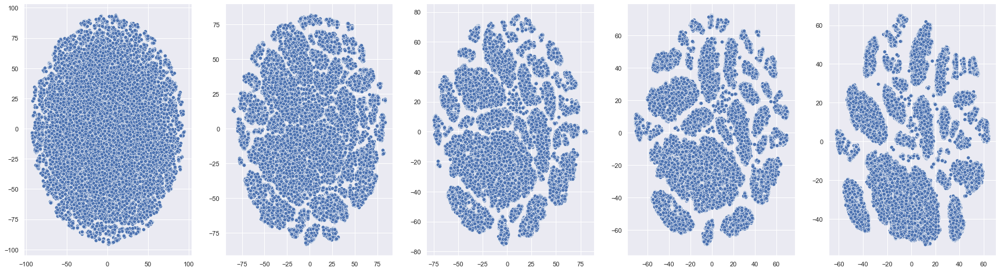

In [84]:
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], ax = axes[0])
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1], ax = axes[1])
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1], ax = axes[2])
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1], ax = axes[3])
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1], ax = axes[4])
plt.show()

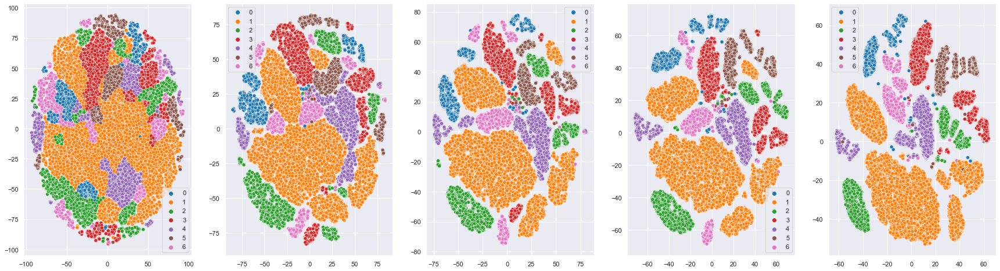

In [85]:
#7 clusters (kmeans)
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= km7.labels_, ax = axes[0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= km7.labels_, ax = axes[1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= km7.labels_, ax = axes[2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= km7.labels_, ax = axes[3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= km7.labels_, ax = axes[4], palette='tab10')
plt.show()

D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in

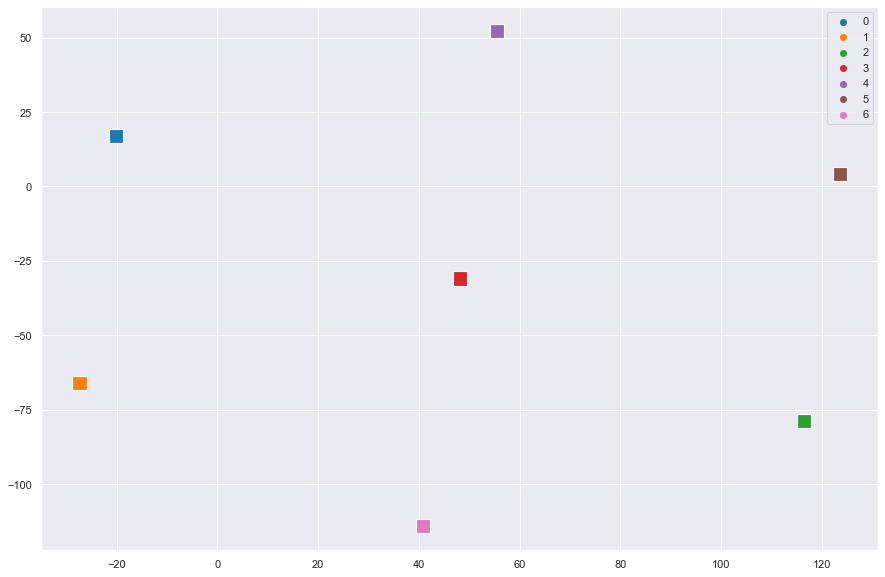

In [86]:
### Centroids visualisation
centroids = km7.cluster_centers_
ker_embedded5 = model1.fit_transform(centroids)
ker_embedded15 = model2.fit_transform(centroids)
ker_embedded30 = model3.fit_transform(centroids)
ker_embedded50 = model4.fit_transform(centroids)
ker_embedded100 = model5.fit_transform(centroids)

plt.figure(figsize=(15,10))
sns.scatterplot(x = ker_embedded100[:,0], y = ker_embedded100[:,1],hue= [0,1,2,3,4,5,6], palette='tab10', marker='s', s=200)
plt.show()

#### Clusters Consistency

In [87]:
df_red_v.pivot_table(index=km2.labels_, values = df_red_v.columns, aggfunc='mean').T

,0,1
Product_count_mean,1.130616,1.147241
delay_mean,23.933700,24.702227
installment_1,0.998277,0.002874
installment_10,0.002878,0.123705
installment_2,0.005864,0.221188
installment_3,0.004318,0.202501
installment_4,0.002596,0.139568
installment_5,0.002110,0.106175
installment_999,0.003432,0.205726
order_id_count,1.027249,1.035817


In [88]:
df_red_v.pivot_table(index=km7.labels_, values = df_red_v.columns, aggfunc='mean').T

,0,1,2,3,4,5,6
Product_count_mean,1.142967,1.129569,1.116160,1.111853,1.169729,1.257477,1.126630
delay_mean,24.845177,23.915164,24.303499,23.767779,25.407494,25.649421,24.814767
installment_1,0.016475,0.999644,0.022640,0.028265,0.016150,0.019444,0.016351
installment_10,0.001786,0.000230,0.001302,0.000890,0.004903,0.991638,0.000866
installment_2,0.001720,0.000177,0.000113,0.988465,0.001309,0.000984,0.000611
installment_3,0.004698,0.000076,0.991355,0.003480,0.000681,0.000984,0.003311
installment_4,0.005425,0.000090,0.000387,0.001827,0.000716,0.000637,0.986756
installment_5,0.982400,0.000136,0.000317,0.000159,0.000147,0.000694,0.000306
installment_999,0.007940,0.000329,0.002260,0.000683,0.991860,0.002286,0.005094
order_id_count,1.047241,1.024890,1.032735,1.036225,1.039388,1.035417,1.039425


In [90]:
# Anova test for getting significant variables
import scipy.stats as stats
min_sample = 2519
min_id = 0
for col in df_red_v.columns:
    print(col)
    print(
        stats.f_oneway(
            df_red_v[col][km7.labels_ == min_id],
            df_red_v[col][km7.labels_ == 6].sample((km7.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][km7.labels_ == 1].sample((km7.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][km7.labels_ == 2].sample((km7.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][km7.labels_ == 3].sample((km7.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][km7.labels_ == 4].sample((km7.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][km7.labels_ == 5].sample((km7.labels_ == min_id).sum(), random_state=42)
            
        ), '\n'
    )

recence_min
F_onewayResult(statistic=2.187393589776009, pvalue=0.041154709541384574) 

order_id_count
F_onewayResult(statistic=3.024457701021966, pvalue=0.0058929455458348505) 

payment_value
F_onewayResult(statistic=391.90057569952785, pvalue=0.0) 

delay_mean
F_onewayResult(statistic=27.104680158855825, pvalue=2.3433225070842754e-32) 

installment_1
F_onewayResult(statistic=24417.74051668765, pvalue=0.0) 

installment_2
F_onewayResult(statistic=284726.2309167026, pvalue=0.0) 

installment_3
F_onewayResult(statistic=195921.5122388359, pvalue=0.0) 

installment_4
F_onewayResult(statistic=202605.65088553296, pvalue=0.0) 

installment_5
F_onewayResult(statistic=251637.2759414766, pvalue=0.0) 

installment_10
F_onewayResult(statistic=268549.89680129034, pvalue=0.0) 

installment_999
F_onewayResult(statistic=180666.09039369135, pvalue=0.0) 

product_category_name_mean
F_onewayResult(statistic=4.31785843279281, pvalue=0.00023328883831914322) 

Product_count_mean
F_onewayResult(statistic=18.

#### Kmeans tunning 

In [66]:
### All variables look significant
# What happens when trying to reduce variables using tree classification aglorithm

In [67]:
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
x_train, x_test, y_train, y_test = train_test_split(df_scaled, km7.labels_, test_size=0.3, stratify=km7.labels_, random_state=3)

In [68]:
from sklearn.model_selection import cross_validate
model_tree = cross_validate(DecisionTreeClassifier(random_state=3), x_train, y_train, cv=5, scoring='r2')
model_tree['test_score'].mean()

0.995146889389247

In [69]:
from sklearn.model_selection import cross_validate
model_ftree = cross_validate(RandomForestClassifier(random_state=3), x_train, y_train, cv=5, scoring='r2')
model_ftree['test_score'].mean()

0.9939595934682586

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=3), n_jobs=4,
             param_grid={'min_samples_leaf': range(2, 100, 10)})
{'min_samples_leaf': 2} 

DecisionTreeClassifier(min_samples_leaf=2, random_state=3) 

R2 : 0.9933317048708636 

MAE : -0.0054903936843027235 

RMSE : -0.0054903936843027235 



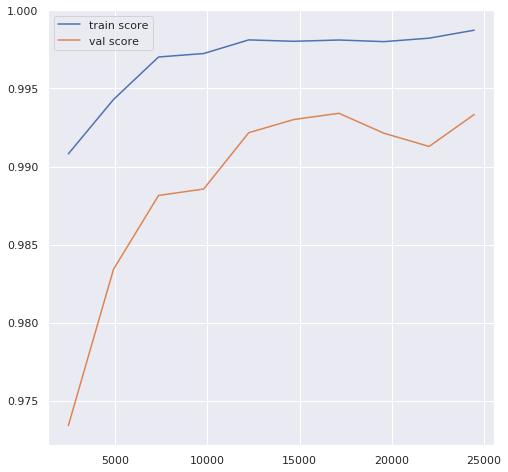

In [70]:
model = GridSearchCV(DecisionTreeClassifier(random_state=3),{'min_samples_leaf':range(2,100,10)},cv=5,n_jobs=4, )
#model = GridSearchCV(RandomForestClassifier(random_state=3),{'min_samples_leaf':range(2,41,2), 'n_estimators':range(2,21,2)}, cv=5,n_jobs=6)
print(model)
model.fit(x_train,y_train)
print(model.best_params_, '\n')
print(model.best_estimator_, '\n')
scores = {'R2':'r2', 'MAE':'neg_mean_absolute_error', 'RMSE':'neg_mean_absolute_error'}
resultat = cross_validate(model.best_estimator_,x_train, y_train, cv=5, scoring=scores)

print('R2 :', resultat['test_R2'].mean(),'\n')
print('MAE :', resultat['test_MAE'].mean(),'\n')
print('RMSE :', resultat['test_RMSE'].mean() ,'\n')

N, train_score, val_score = learning_curve(model.best_estimator_, x_train, y_train, cv= 5,
                                       scoring = 'r2',
                                      train_sizes = np.linspace(0.1, 1, 10))

plt.figure(figsize=(8,8))
plt.plot(N, train_score.mean(axis = 1), label='train score')
plt.plot(N, val_score.mean(axis = 1), label='val score')
plt.legend()
plt.show()

In [79]:
from sklearn.feature_selection import RFECV

var_retenus_quant = []
score_finale = []

selector=RFECV(model.best_estimator_,cv=5, scoring='r2', n_jobs=5)
selector = selector.fit(x_train, y_train)

vars = x_train.columns[selector.support_]
print(vars)
print('score is:', selector.score(x_train, y_train) )
      

Index(['installment_1', 'installment_2', 'installment_3', 'installment_4',
       'installment_5', 'installment_10', 'installment_999',
       'prct_fret_on_global_price_mean', 'review_score'],
      dtype='object')
score is: 0.9996078303212523


/home/mrjp/anaconda3/lib/python3.7/site-packages/sklearn/base.py:446: UserWarning: X does not have valid feature names, but RFECV was fitted with feature names
  "X does not have valid feature names, but"


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=3), n_jobs=4,
             param_grid={'min_samples_leaf': range(2, 100, 10)})
{'min_samples_leaf': 2} 

DecisionTreeClassifier(min_samples_leaf=2, random_state=3) 

R2 : 0.9938338036794357 

MAE : -0.005098279547151431 

RMSE : -0.005098279547151431 



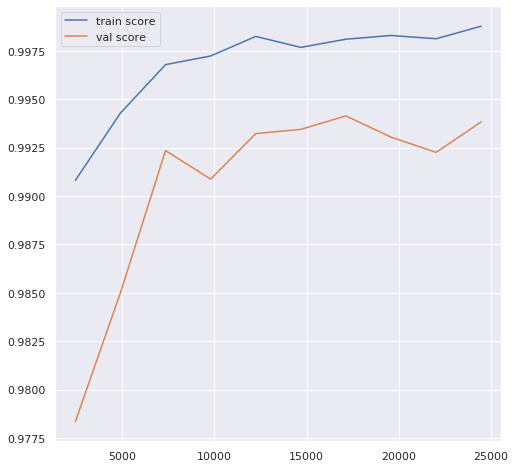

In [81]:
model = GridSearchCV(DecisionTreeClassifier(random_state=3),{'min_samples_leaf':range(2,100,10)},cv=5,n_jobs=4, )
#model = GridSearchCV(RandomForestClassifier(random_state=3),{'min_samples_leaf':range(2,41,2), 'n_estimators':range(2,21,2)}, cv=5,n_jobs=6)
print(model)
model.fit(x_train[vars],y_train)
print(model.best_params_, '\n')
print(model.best_estimator_, '\n')
scores = {'R2':'r2', 'MAE':'neg_mean_absolute_error', 'RMSE':'neg_mean_absolute_error'}
resultat = cross_validate(model.best_estimator_,x_train[vars], y_train, cv=5, scoring=scores)

print('R2 :', resultat['test_R2'].mean(),'\n')
print('MAE :', resultat['test_MAE'].mean(),'\n')
print('RMSE :', resultat['test_RMSE'].mean() ,'\n')

N, train_score, val_score = learning_curve(model.best_estimator_, x_train[vars], y_train, cv= 5,
                                       scoring = 'r2',
                                      train_sizes = np.linspace(0.1, 1, 10))

plt.figure(figsize=(8,8))
plt.plot(N, train_score.mean(axis = 1), label='train score')
plt.plot(N, val_score.mean(axis = 1), label='val score')
plt.legend()
plt.show()

In [82]:
x_train.columns

Index(['order_id_count', 'payment_value', 'nb_distinct_order_month',
       'delay_mean', 'installment_1', 'installment_2', 'installment_3',
       'installment_4', 'installment_5', 'installment_10', 'installment_999',
       'product_category_name_mean', 'Product_count_mean',
       'prct_fret_on_global_price_mean', 'review_score'],
      dtype='object')

In [83]:
len(x_train.columns) , len(vars)

(15, 9)

In [84]:
### test: is feature reduced dataset provides good score
df_reduce = df_scaled[vars]

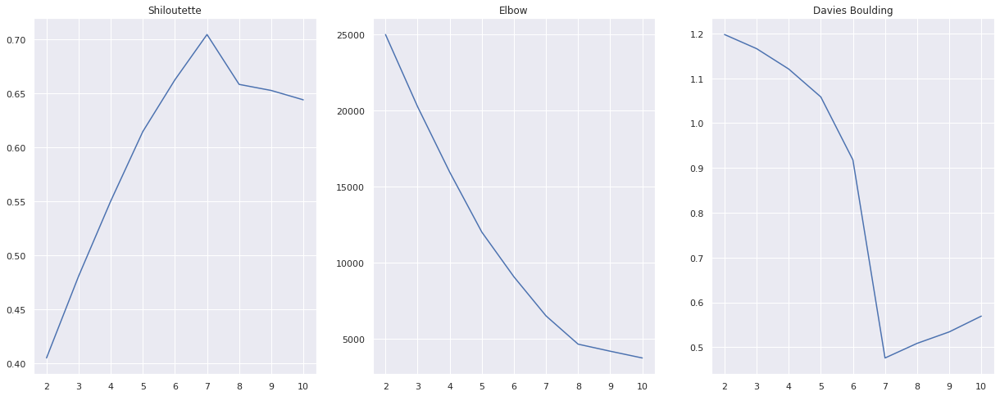

[0.4048623279335476, 0.48069906173116034, 0.5502330081367512, 0.6146546055104878, 0.6626264252033718, 0.7045742370327632, 0.6583706676989637, 0.6527360703712125, 0.6440589413132438]
[1.1977667619915495, 1.1662273737739648, 1.1207747545638713, 1.0584995780831803, 0.9178982075608587, 0.47582642762486016, 0.5084758235516098, 0.5340365396939326, 0.5692764122503786]
[24980.880500093965, 20239.281032042436, 15943.73428652548, 12005.38825228182, 9067.697806160199, 6501.027066418159, 4643.496725730904, 4180.70015989292, 3735.66243299689]


,homogeneity,completness,v_measure,ARI,MI
2,1.000000,1.000000,1.000000,1.000000,1.000000
3,1.000000,1.000000,1.000000,1.000000,1.000000
4,1.000000,1.000000,1.000000,1.000000,1.000000
5,1.000000,1.000000,1.000000,1.000000,1.000000
6,0.998646,0.998638,0.998642,0.999669,0.998642
7,0.992838,0.992655,0.992746,0.998182,0.992745
8,0.997434,0.997371,0.997403,0.999210,0.997402
9,0.998586,0.998560,0.998573,0.999604,0.998572
10,0.999097,0.999041,0.999069,0.999685,0.999069


In [87]:
resultat_km(0,9, df_reduce)

#### Clustering Insights

In [88]:
km7_prime = cluster.KMeans(n_clusters=7, random_state=42).fit(df_reduce)

In [89]:
pd.Series(km7_prime.labels_).value_counts()

1    20291
6     5213
3     4793
2     4771
5     3261
4     2878
0     2506
dtype: int64

In [96]:
df_red_v.pivot_table(index=km7_prime.labels_, values = df_red_v.columns, aggfunc='mean').T

,0,1,2,3,4,5,6
Product_count_mean,1.142473,1.129589,1.169912,1.116145,1.257250,1.126667,1.112092
delay_mean,24.820497,23.916331,25.404206,24.295966,25.639507,24.832694,23.779526
installment_1,0.016361,0.999620,0.016052,0.022540,0.019284,0.016406,0.028279
installment_10,0.001596,0.000255,0.004974,0.001391,0.992037,0.001022,0.000799
installment_2,0.001330,0.000177,0.001415,0.003415,0.001042,0.001176,0.991208
installment_3,0.003724,0.000076,0.000157,0.985966,0.000811,0.000153,0.000464
installment_4,0.004323,0.000090,0.000786,0.002538,0.000347,0.988398,0.001551
installment_5,0.984570,0.000160,0.000147,0.000904,0.000869,0.001176,0.000288
installment_999,0.007848,0.000353,0.991822,0.002824,0.002287,0.005009,0.000591
nb_distinct_order_month,1.022745,1.010793,1.014672,1.020655,1.017721,1.016866,1.014195


In [91]:
# Anova test for getting significant variables
import scipy.stats as stats

for col in df_reduce.columns:
    print(col)
    print(
        stats.f_oneway(
            df_red_v[col][km7_prime.labels_ == 0],
            df_red_v[col][km7_prime.labels_ == 1].sample((km7_prime.labels_ == 0).sum(), random_state=42),
            df_red_v[col][km7_prime.labels_ == 2].sample((km7_prime.labels_ == 0).sum(), random_state=42),
            df_red_v[col][km7_prime.labels_ == 6].sample((km7_prime.labels_ == 0).sum(), random_state=42),
            df_red_v[col][km7_prime.labels_ == 3].sample((km7_prime.labels_ == 0).sum(), random_state=42),
            df_red_v[col][km7_prime.labels_ == 4].sample((km7_prime.labels_ == 0).sum(), random_state=42),
            df_red_v[col][km7_prime.labels_ == 5].sample((km7_prime.labels_ == 0).sum(), random_state=42)
            
        ), '\n'
    )

installment_1
F_onewayResult(statistic=22902.432734119757, pvalue=0.0) 

installment_2
F_onewayResult(statistic=266289.49486439914, pvalue=0.0) 

installment_3
F_onewayResult(statistic=234280.79123194123, pvalue=0.0) 

installment_4
F_onewayResult(statistic=212711.39615233932, pvalue=0.0) 

installment_5
F_onewayResult(statistic=243800.3778728536, pvalue=0.0) 

installment_10
F_onewayResult(statistic=264692.09119606495, pvalue=0.0) 

installment_999
F_onewayResult(statistic=180978.48747001146, pvalue=0.0) 

prct_fret_on_global_price_mean
F_onewayResult(statistic=275.21122533123145, pvalue=0.0) 

review_score
F_onewayResult(statistic=3.9156593809681497, pvalue=0.0006504181109042034) 



#### Kmeans on PCA first 8 components 

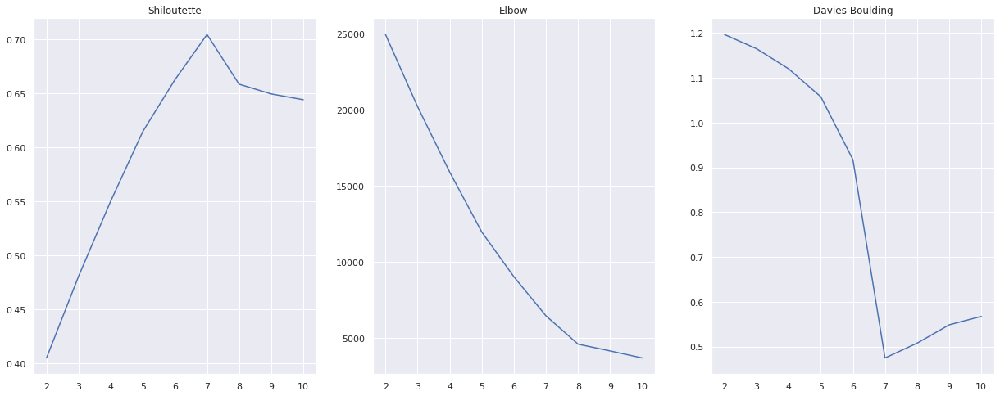

[0.40508612714236725, 0.4807956495256532, 0.5503323989253556, 0.6147132812149784, 0.6626712820867902, 0.7045318385100224, 0.6585362131579454, 0.6495197842589043, 0.6441488099265953]
[1.1966135198453365, 1.164851332961595, 1.1199594883817026, 1.0576431921507412, 0.9174358779908135, 0.4747158333069227, 0.507802030666092, 0.5487450862609101, 0.5675646987285667]
[24928.97290829872, 20186.920572763025, 15891.387000058327, 11953.024749426359, 9015.273174025775, 6448.650278358558, 4589.754152170145, 4144.3941978633375, 3682.054232910551]


,homogeneity,completness,v_measure,ARI,MI
2,1.000000,1.000000,1.000000,1.000000,1.000000
3,1.000000,1.000000,1.000000,1.000000,1.000000
4,1.000000,1.000000,1.000000,1.000000,1.000000
5,1.000000,1.000000,1.000000,1.000000,1.000000
6,0.995009,0.995023,0.995016,0.998758,0.995015
7,0.993470,0.993232,0.993351,0.998550,0.993349
8,0.999462,0.999477,0.999469,0.999834,0.999469
9,0.943520,0.945681,0.944599,0.955899,0.944578
10,0.998070,0.997967,0.998019,0.999450,0.998018


In [93]:
resultat_km(0,9, df_pca[:,:8])

In [94]:
km_pca = cluster.KMeans(n_clusters=7, random_state=42).fit(df_pca)

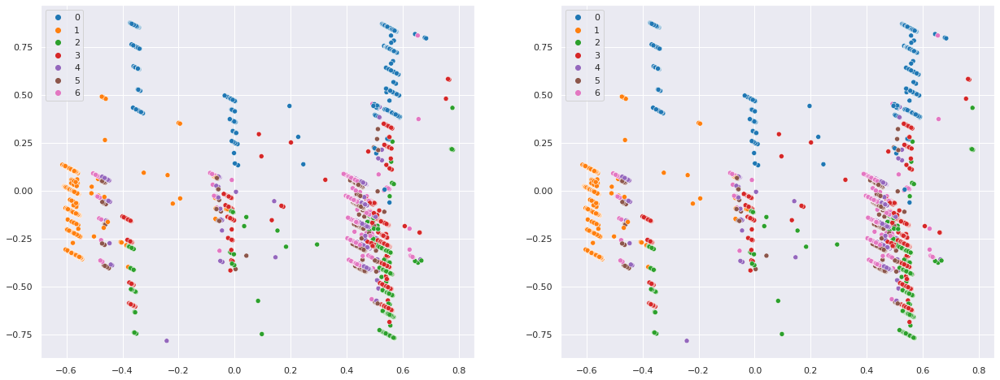

In [95]:
fig, axes = plt.subplots(1,2,figsize=(21,8))
sns.scatterplot(x= df_pca[:,0], y = df_pca[:,1], hue=km7.labels_, ax = axes[0], palette = 'tab10')
sns.scatterplot(x= df_pca[:,0], y = df_pca[:,1], hue=km_pca.labels_, ax = axes[1], palette = 'tab10')
plt.show()

#### DBscan methods

In [91]:
def checking_global(p,k,df, algo, rand1=42, rand2=3):
    res = []
    davies_boulding = []
    elbow = []
    ARI = []
    MI = []
    homogeneity = []
    completness = []
    v_measure = []
    
    for k in np.arange(p,k):
        km1 = algo
        km1._random_state = rand1
        km1.fit(df)
        res.append(
            metrics.silhouette_score(df,km1.labels_)
        )
        
        davies_boulding.append(
            metrics.davies_bouldin_score(df,km1.labels_)
        )
        

        elbow.append(
            km1.inertia_
        )

        km2 = algo
        km2._random_state = rand2
        km2.fit(df)
        ARI.append(
            adjusted_rand_score(km1.labels_, km2.labels_)
        )

        MI.append(
            metrics.adjusted_mutual_info_score(km1.labels_, km2.labels_)
        )

        homogeneity.append(
            metrics.homogeneity_score(km1.labels_, km2.labels_)
        )

        completness.append(
                metrics.completeness_score(km1.labels_, km2.labels_)
        )

        v_measure.append(
                metrics.v_measure_score(km1.labels_, km2.labels_)
        )
    return res, davies_boulding, elbow, ARI, MI, homogeneity, completness, v_measure

def resultat_dbscan(p,k,df, algo):
    res, davies_boulding, elbow, ARI, MI, homogeneity, completness, v_measure =  checking_dbscan(p,k,df, algo)
    
    fig, axes = plt.subplots(1,3,figsize=(21,8))
    sns.lineplot(x = np.arange(p+2,k+2,1), y = res, ax = axes[0])
    sns.lineplot(x = np.arange(p+2,k+2,1), y = elbow, ax = axes[1] )
    sns.lineplot(x = np.arange(p+2,k+2,1), y = davies_boulding, ax = axes[2])
    axes[0].title.set_text('Shiloutette')
    axes[1].title.set_text('Elbow')
    axes[2].title.set_text('Davies Boulding')
    plt.show()
    
    print(res, '\n')

    
    print(davies_boulding, '\n')
    #graphique


    print(elbow, '\n')
    #graphique


    return pd.DataFrame({'homogeneity':homogeneity, 'completness':completness, 'v_measure':v_measure,'ARI':ARI,'MI':MI}, index=np.arange(p+2,k+2,1))  

In [92]:
from sklearn.cluster import DBSCAN

In [95]:
#Pour eps =0.5, min_sample = (600, 8, 0.5743823133520667) / (700, 8, 0.5772709872293683) / (680, 8, 0.5785744468625967) / (680, 8, 0.5789137764873477)/ (676, 8, 0.5789137764873477)
#reduce : eps =0.5, (688, 8, 0.582320487800691)
sil=[]
nc = []
a = 675
b= 685
c = 1
for i in range(a,b,c):
    print(i)
    clusterer =  DBSCAN(eps = 0.5, min_samples=i, n_jobs=6 )
    clusterer.fit(df_scaled)
    sil.append(
        metrics.silhouette_score(df_scaled,clusterer.labels_)
    )
    nc.append(
        len(set(clusterer.labels_))
    )
        

675
676
677
678
679
680
681
682
683
684


In [96]:
range(a,b,c)[np.argmax(sil)], nc[np.argmax(sil)], max(sil)

(676, 8, 0.5789137764873477)

0.5789137764873477


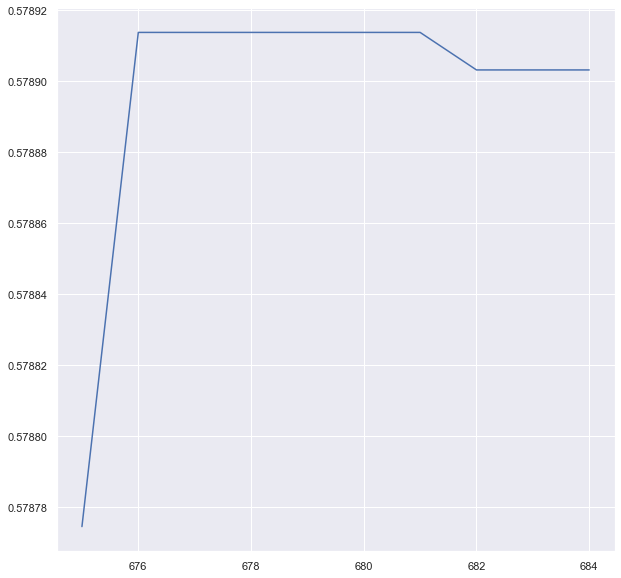

In [176]:
print(max(sil))
plt.figure(figsize=(10,10))
plt.plot(range(a,b,c), sil)
plt.show()

In [98]:
### dscan with best params, silouhette = 0.5785744468625967
clusterer =  DBSCAN(eps = 0.5, min_samples=672, n_jobs=6 )
clusterer.fit(df_scaled)

DBSCAN(min_samples=672, n_jobs=6)

In [99]:
pd.Series(clusterer.labels_).value_counts()

 4    20230
 3     4978
 1     4596
 2     4551
 0     3097
 6     2358
 5     2084
-1     1819
dtype: int64

In [100]:
 pd.Series(km7.labels_).value_counts()

1    20289
3     5245
4     4773
2     4735
6     3272
5     2880
0     2519
dtype: int64

#### Dbscan visualisation

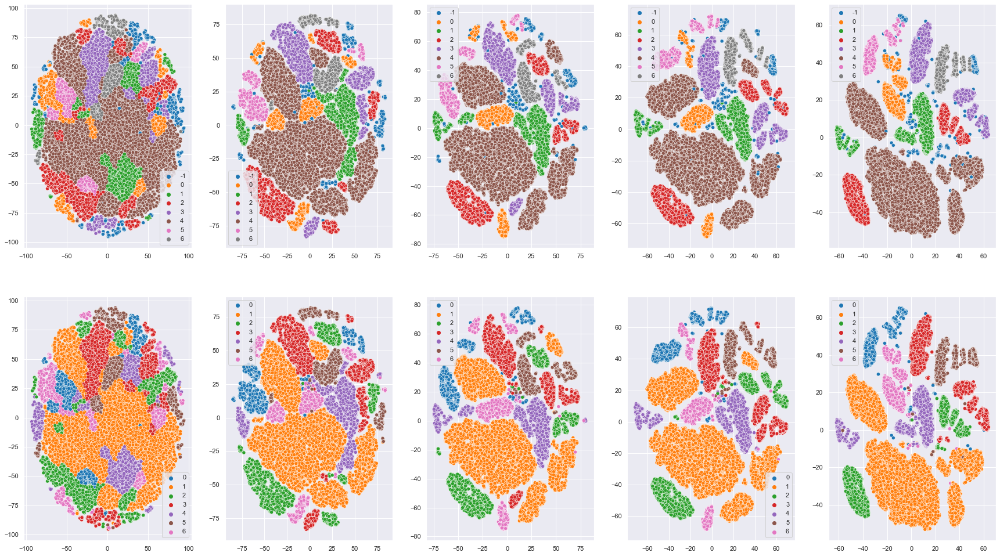

In [101]:
#7 clusters (kmeans)
fig, axes = plt.subplots(2,5,figsize=(30,17))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= clusterer.labels_, ax = axes[0,0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= clusterer.labels_, ax = axes[0,1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= clusterer.labels_, ax = axes[0,2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= clusterer.labels_, ax = axes[0,3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= clusterer.labels_, ax = axes[0,4], palette='tab10')

sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= km7.labels_, ax = axes[1,0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= km7.labels_, ax = axes[1,1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= km7.labels_, ax = axes[1,2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= km7.labels_, ax = axes[1,3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= km7.labels_, ax = axes[1,4], palette='tab10')
plt.show()

In [102]:
### Centroids visualisation
centroids_db = df_scaled.groupby(by=clusterer.labels_).mean()
centroids_db
ker_embedded100_db = model5.fit_transform(centroids_db)

D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


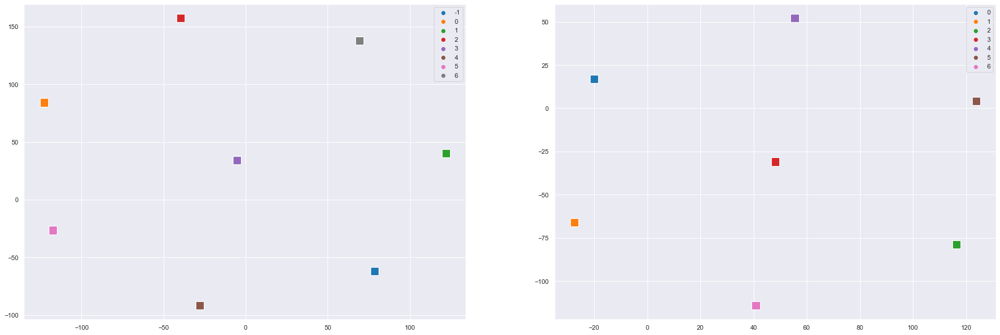

In [104]:
fig, axes = plt.subplots(1,2,figsize=(30,10))
sns.scatterplot(x = ker_embedded100_db[:,0], y = ker_embedded100_db[:,1],hue= [-1,0,1,2,3,4,5,6], ax=axes[0], palette='tab10', marker='s', s=200)
sns.scatterplot(x = ker_embedded100[:,0], y = ker_embedded100[:,1],hue= [0,1,2,3,4,5,6], ax=axes[1], palette='tab10', marker='s', s=200)
plt.show()

In [105]:
#### Dbscan clusters insights

In [106]:
#kmeans
pd.Series(km7_prime.labels_).value_counts()

1    20290
3     5213
0     4804
4     4769
6     3266
2     2880
5     2491
dtype: int64

In [107]:
#dbscan
pd.Series(clusterer.labels_).value_counts()

 4    20230
 3     4978
 1     4596
 2     4551
 0     3097
 6     2358
 5     2084
-1     1819
dtype: int64

In [108]:
df_red_v.pivot_table(index=clusterer.labels_, values = df_scaled.columns, aggfunc='mean').T

,-1,0,1,2,3,4,5,6
Product_count_mean,1.403038,1.109192,1.160801,1.110807,1.100604,1.126200,1.119082,1.201442
delay_mean,25.753491,24.738214,25.385952,24.279096,23.771796,23.890074,24.691139,25.511733
installment_1,0.296216,0.000000,0.000054,0.000146,0.000000,0.999782,0.000000,0.000000
installment_10,0.297957,0.000000,0.000326,0.000073,0.000000,0.000000,0.000160,1.000000
installment_2,0.123768,0.000000,0.000054,0.000073,0.999866,0.000049,0.000000,0.000000
installment_3,0.105607,0.000000,0.000000,0.999634,0.000067,0.000041,0.000000,0.000000
installment_4,0.089335,1.000000,0.000073,0.000073,0.000067,0.000016,0.000000,0.000000
installment_5,0.218637,0.000000,0.000000,0.000000,0.000000,0.000136,0.999520,0.000000
installment_999,0.111838,0.000000,0.999547,0.000000,0.000000,0.000016,0.000320,0.000000
order_id_count,1.313909,1.011624,1.021540,1.016040,1.011852,1.023628,1.013436,1.018660


In [184]:
# Anova test for getting significant variables
import scipy.stats as stats
min_sample = 1819
min_id = -1
for col in df_red_v.columns.tolist():
    print(col)
    print(
        stats.f_oneway(
            df_red_v[col][clusterer.labels_ == min_id],
            df_red_v[col][clusterer.labels_ == 0].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 6].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 1].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 2].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 3].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 4].sample((clusterer.labels_ == min_id).sum(), random_state=42),
            df_red_v[col][clusterer.labels_ == 5].sample((clusterer.labels_ == min_id).sum(), random_state=42)
            
        ), '\n'
    )

recence_min
F_onewayResult(statistic=3.0276748473301085, pvalue=0.00351000306914974) 

order_id_count
F_onewayResult(statistic=342.58925388831545, pvalue=0.0) 

payment_value
F_onewayResult(statistic=234.60447351745964, pvalue=0.0) 

delay_mean
F_onewayResult(statistic=14.35394213169709, pvalue=1.0048587814778232e-18) 

installment_1
F_onewayResult(statistic=10010.167539696637, pvalue=0.0) 

installment_2
F_onewayResult(statistic=19969.658125886017, pvalue=0.0) 

installment_3
F_onewayResult(statistic=24508.44980137893, pvalue=0.0) 

installment_4
F_onewayResult(statistic=27805.735965953812, pvalue=0.0) 

installment_5
F_onewayResult(statistic=11263.072890720496, pvalue=0.0) 

installment_10
F_onewayResult(statistic=9537.901398304142, pvalue=0.0) 

installment_999
F_onewayResult(statistic=24056.269177921025, pvalue=0.0) 

product_category_name_mean
F_onewayResult(statistic=169.7494665438535, pvalue=2.01733071350009e-242) 

Product_count_mean
F_onewayResult(statistic=52.31014325980569, 

D:\Anaconda\lib\site-packages\scipy\stats\stats.py:3650: F_onewayConstantInputWarning: Each of the input arrays is constant;the F statistic is not defined or infinite
  warnings.warn(F_onewayConstantInputWarning())


In [183]:
df_red_v.columns.tolist()

['index',
 'customer_unique_id',
 'recence_min',
 'order_id_count',
 'payment_value',
 'delay_mean',
 'installment_1',
 'installment_2',
 'installment_3',
 'installment_4',
 'installment_5',
 'installment_10',
 'installment_999',
 'product_category_name_mean',
 'Product_count_mean',
 'prct_fret_on_global_price_mean',
 'review_score',
 'oldlab']

#### Cluster Persistency Study

In [311]:
#date_checking = ['04/01','07/01']
#i=1
#j=8
#X = db_generator(2018,range(i,j), '2019/'+'01/01')

/home/mrjp/anaconda3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


In [137]:
X = data_2018

In [138]:
data_2018.head()

,delay_max,delay_mean,delay_min,delay_std,duree_max,duree_mean,duree_min,duree_std,order_id_count,nb_distinct_order_month,...,last_order_value,installment_1,installment_10,installment_2,installment_3,installment_4,installment_5,installment_999,payment_value,review_score
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,10.0,10.0,10.0,0.0,0.0,0.0,0.0,0.0,1,1,...,141.90,0.0,0.0,0.0,0.0,0.0,0.0,1.0,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,7.0,7.0,7.0,0.0,0.0,0.0,0.0,0.0,1,1,...,27.19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,27.19,4.0
0004bd2a26a76fe21f786e4fbd80607f,13.0,13.0,13.0,0.0,0.0,0.0,0.0,0.0,1,1,...,166.98,0.0,0.0,0.0,0.0,0.0,0.0,1.0,166.98,4.0
00050ab1314c0e55a6ca13cf7181fecf,18.0,18.0,18.0,0.0,0.0,0.0,0.0,0.0,1,1,...,35.38,1.0,0.0,0.0,0.0,0.0,0.0,0.0,35.38,4.0
00053a61a98854899e70ed204dd4bafe,25.0,25.0,25.0,0.0,0.0,0.0,0.0,0.0,1,1,...,209.59,0.0,0.0,0.0,1.0,0.0,0.0,0.0,419.18,1.0


In [139]:
X.shape

(52749, 34)

In [140]:
var_first_filter = df_scaled.columns.tolist()

In [141]:
len(var_first_filter)

15

In [142]:
da = X.copy()

In [147]:
X = da.copy()
X.head()

,delay_max,delay_mean,delay_min,delay_std,duree_max,duree_mean,duree_min,duree_std,order_id_count,nb_distinct_order_month,...,last_order_value,installment_1,installment_10,installment_2,installment_3,installment_4,installment_5,installment_999,payment_value,review_score
customer_unique_id,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,10.0,10.0,10.0,0.0,0.0,0.0,0.0,0.0,1,1,...,141.90,0.0,0.0,0.0,0.0,0.0,0.0,1.0,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,7.0,7.0,7.0,0.0,0.0,0.0,0.0,0.0,1,1,...,27.19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,27.19,4.0
0004bd2a26a76fe21f786e4fbd80607f,13.0,13.0,13.0,0.0,0.0,0.0,0.0,0.0,1,1,...,166.98,0.0,0.0,0.0,0.0,0.0,0.0,1.0,166.98,4.0
00050ab1314c0e55a6ca13cf7181fecf,18.0,18.0,18.0,0.0,0.0,0.0,0.0,0.0,1,1,...,35.38,1.0,0.0,0.0,0.0,0.0,0.0,0.0,35.38,4.0
00053a61a98854899e70ed204dd4bafe,25.0,25.0,25.0,0.0,0.0,0.0,0.0,0.0,1,1,...,209.59,0.0,0.0,0.0,1.0,0.0,0.0,0.0,419.18,1.0


In [148]:
X = X[var_first_filter]
X.loc[:,var_first_filter] = sc_red.transform(X)

In [149]:
X.shape

(52749, 15)

In [150]:

X.head()

,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score
customer_unique_id,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.652778,0.0,0.009655,0.021583,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.099301,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,0.661111,0.0,0.001254,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.358013,0.75
0004bd2a26a76fe21f786e4fbd80607f,0.750000,0.0,0.011492,0.043165,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.091278,0.75
00050ab1314c0e55a6ca13cf7181fecf,0.708333,0.0,0.001854,0.079137,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.245268,0.75
00053a61a98854899e70ed204dd4bafe,0.850000,0.0,0.029963,0.129496,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.05,0.104151,0.00


In [151]:
from scipy.spatial import distance
def cluster_predict(new):
    global centroids_db
    #Centroids series
    dist = []
    for center in centroids_db.iterrows():
        dist.append(
            distance.euclidean(new, center[1])
        )
        k = np.argmax(dist)
    return centroids_db.index[k]
    

In [152]:
X['newlab'] = [cluster_predict(cust[1]) for cust in X.iterrows()]

In [153]:
X['newlab'].value_counts()

3    13205
6    12579
1     8000
4     7278
5     6477
0     5066
2      144
Name: newlab, dtype: int64

In [154]:
X.reset_index(inplace=True)

In [155]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52749 entries, 0 to 52748
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   customer_unique_id              52749 non-null  object 
 1   recence_min                     52749 non-null  float64
 2   order_id_count                  52749 non-null  float64
 3   payment_value                   52749 non-null  float64
 4   delay_mean                      52749 non-null  float64
 5   installment_1                   52749 non-null  float64
 6   installment_2                   52749 non-null  float64
 7   installment_3                   52749 non-null  float64
 8   installment_4                   52749 non-null  float64
 9   installment_5                   52749 non-null  float64
 10  installment_10                  52749 non-null  float64
 11  installment_999                 52749 non-null  float64
 12  product_category_name_mean      

In [156]:
X.head()

,customer_unique_id,recence_min,order_id_count,payment_value,delay_mean,installment_1,installment_2,installment_3,installment_4,installment_5,installment_10,installment_999,product_category_name_mean,Product_count_mean,prct_fret_on_global_price_mean,review_score,newlab
0,0000366f3b9a7992bf8c76cfdf3221e2,0.652778,0.0,0.009655,0.021583,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.099301,1.00,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.661111,0.0,0.001254,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.358013,0.75,6
2,0004bd2a26a76fe21f786e4fbd80607f,0.750000,0.0,0.011492,0.043165,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.091278,0.75,4
3,00050ab1314c0e55a6ca13cf7181fecf,0.708333,0.0,0.001854,0.079137,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.245268,0.75,6
4,00053a61a98854899e70ed204dd4bafe,0.850000,0.0,0.029963,0.129496,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.05,0.104151,0.00,5


Silouette score for new clustering

In [175]:
metrics.silhouette_score(X.loc[:,var_first_filter],X['newlab'])

-0.12796677315287666

In [157]:
df_red_v['oldlab'] = clusterer.labels_

In [158]:
df_red_v.reset_index(inplace=True)
df_red_v.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43713 entries, 0 to 43712
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   index                           43713 non-null  int64  
 1   customer_unique_id              43713 non-null  object 
 2   recence_min                     43713 non-null  int64  
 3   order_id_count                  43713 non-null  int64  
 4   payment_value                   43713 non-null  float64
 5   delay_mean                      43713 non-null  float64
 6   installment_1                   43713 non-null  float64
 7   installment_2                   43713 non-null  float64
 8   installment_3                   43713 non-null  float64
 9   installment_4                   43713 non-null  float64
 10  installment_5                   43713 non-null  float64
 11  installment_10                  43713 non-null  float64
 12  installment_999                 

In [160]:
udf = df_red_v.merge(X[['customer_unique_id','newlab']] ,how='left')

In [165]:
udf['newlab'].astype('object').value_counts()

3.0    202
6.0    132
1.0     93
4.0     90
5.0     83
0.0     81
2.0      1
Name: newlab, dtype: int64

In [171]:
customer_2017_2018 = udf.loc[udf['newlab'].isna()==False,['customer_unique_id','oldlab','newlab']]

In [172]:
customer_2017_2018.shape

(682, 3)

In [173]:
print(
        adjusted_rand_score(customer_2017_2018.oldlab, customer_2017_2018.newlab)
    )

print()
print(
        metrics.homogeneity_score(customer_2017_2018.oldlab, customer_2017_2018.newlab)
    )
print()
print(
        metrics.completeness_score(customer_2017_2018.oldlab, customer_2017_2018.newlab)
    )
print()
print(
        metrics.v_measure_score(customer_2017_2018.oldlab, customer_2017_2018.newlab)
    )

0.012802383501847188

0.019653063857962838

0.019897116980923443

0.01977433742760387


#### /!\ SECTION ABANDONNE

In [ ]:
### clustering sans la recenc

In [ ]:
df_red_1 = df_red.iloc[:,1:]

[0.5338409229932175, 0.5186938357527516, 0.4966592058236171, 0.501506512891887, 0.5210052074152678, 0.5120904264236857, 0.49997687749913994, 0.5165819046669933, 0.5147707011828593]


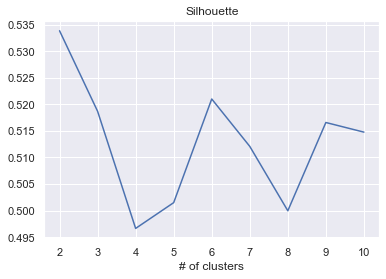

[251.14522931984675, 148.60341059890152, 106.4632773526114, 83.00270499914106, 60.2495097869076, 48.396233483861586, 41.616474243285644, 36.49787910760742, 31.61929703081677]


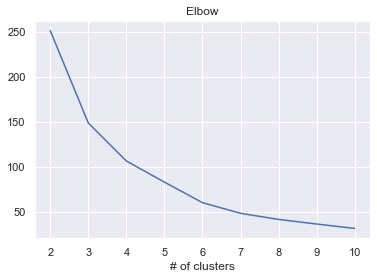

,homogeneity,completness,v_measure,ARI,MI
2,1.000000,1.000000,1.000000,1.000000,1.000000
3,0.985673,0.987169,0.986420,0.993980,0.986420
4,0.989112,0.989168,0.989140,0.994171,0.989140
5,0.936689,0.931968,0.934322,0.945595,0.934314
6,0.998192,0.998071,0.998131,0.999160,0.998131
7,0.945608,0.943116,0.944360,0.943317,0.944347
8,0.966137,0.965438,0.965787,0.964654,0.965777
9,0.991335,0.990884,0.991110,0.993667,0.991106
10,0.976374,0.976965,0.976669,0.978221,0.976659


In [ ]:
resultat(0,9, df_red_1)

In [ ]:
km2_1 = cluster.KMeans(n_clusters=2, random_state=42).fit(df_red_1)
km6_1 = cluster.KMeans(n_clusters=6, random_state=42).fit(df_red_1)

In [ ]:
pca_1 = PCA()
df_red_pca_1 = pca_1.fit_transform(df_red_1)

In [ ]:
pca_1.explained_variance_ratio_

array([0.93298407, 0.05709309, 0.00992284])

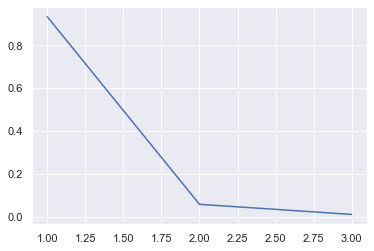

In [ ]:
plt.plot(range(1,4), pca_1.explained_variance_ratio_)

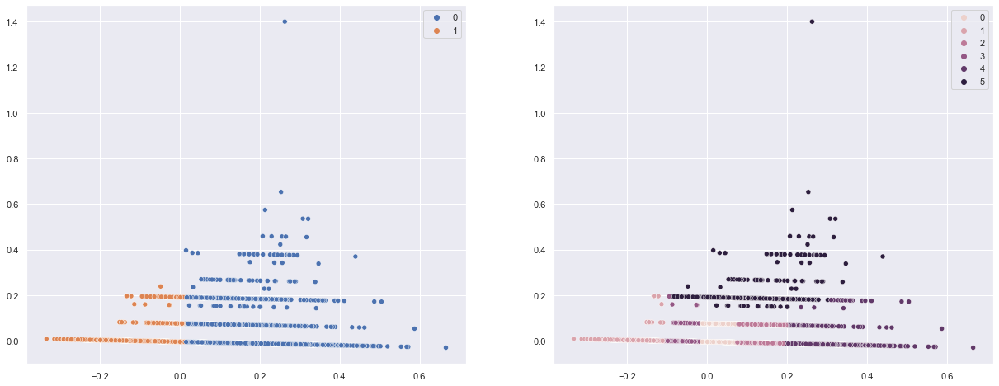

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(21,8))
sns.scatterplot(x= df_red_pca_1[:,0], y = df_red_pca_1[:,1], hue=km2_1.labels_, ax = axes[0])
sns.scatterplot(x= df_red_pca_1[:,0], y = df_red_pca_1[:,1], hue=km6_1.labels_, ax = axes[1])
plt.show()

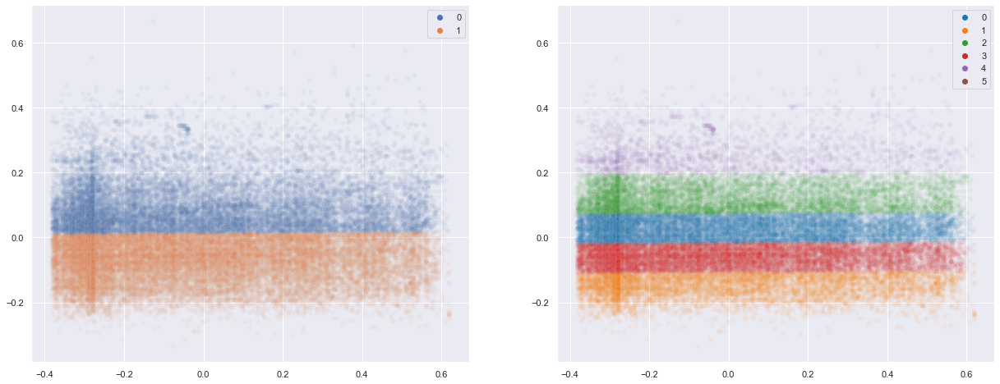

In [ ]:
### Projection in first pca first plan
fig, axes = plt.subplots(1,2,figsize=(21,8))
sns.scatterplot(x= df_red_pca[:,0], y = df_red_pca[:,1], hue=km2_1.labels_, ax = axes[0], alpha=1/20)
sns.scatterplot(x= df_red_pca[:,0], y = df_red_pca[:,1], hue=km6_1.labels_, ax = axes[1], palette='tab10', alpha=1/20)
plt.show()

In [ ]:
df.pivot_table(index=km2_1.labels_, values = df_red.columns, aggfunc='mean').T

,0,1
nb_distinct_order_month,1.028907,1.003325
order_id_count,1.061653,1.009294
payment_value,294.045657,69.558573
recence_min,136.153280,138.105436


In [ ]:
df.pivot_table(index=km6_1.labels_, values = df_red.columns, aggfunc='mean').T

,0,1,2,3,4,5
nb_distinct_order_month,1.000000,1.000400,1.000000,1.000158,1.008740,2.023850
order_id_count,1.018352,1.001731,1.032166,1.005383,1.049218,2.212947
payment_value,136.841368,37.672990,275.315822,73.152775,901.835741,291.340647
recence_min,136.048051,142.839371,137.692538,135.874377,141.752530,101.136286


In [ ]:
df['order_id_count'].value_counts()

1     42457
2      1156
3        80
4        14
5         4
6         1
10        1
Name: order_id_count, dtype: int64

In [ ]:
km3_1 = cluster.KMeans(n_clusters=3, random_state=42).fit(df_red_1)

In [ ]:
df.pivot_table(index=km3_1.labels_, values = df_red.columns, aggfunc='mean').T

,0,1,2
nb_distinct_order_month,1.011288,1.053897,1.001608
order_id_count,1.030516,1.101275,1.004646
payment_value,141.641869,508.586024,53.816933
recence_min,135.521127,137.426688,139.286259


In [ ]:
pd.Series(km2_1.labels_).value_counts()

1    24963
0    18750
dtype: int64

In [ ]:
pd.Series(km6_1.labels_).value_counts()

0    13132
3    12633
2     7679
1     7508
4     2174
5      587
dtype: int64

<Figure size 432x288 with 0 Axes>

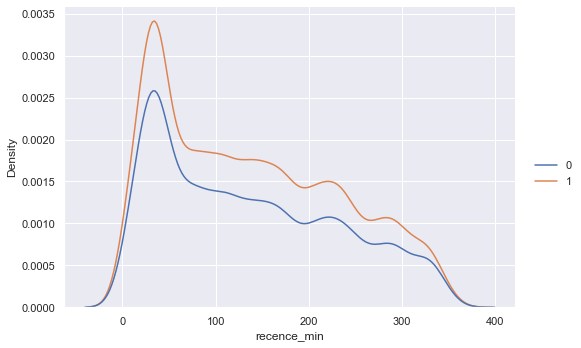

<Figure size 432x288 with 0 Axes>

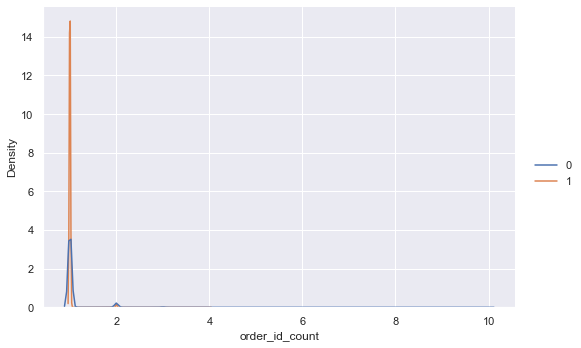

<Figure size 432x288 with 0 Axes>

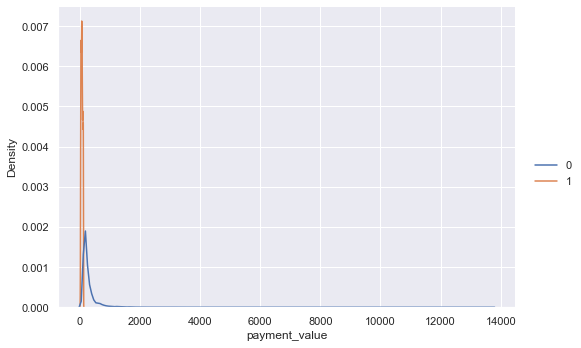

<Figure size 432x288 with 0 Axes>

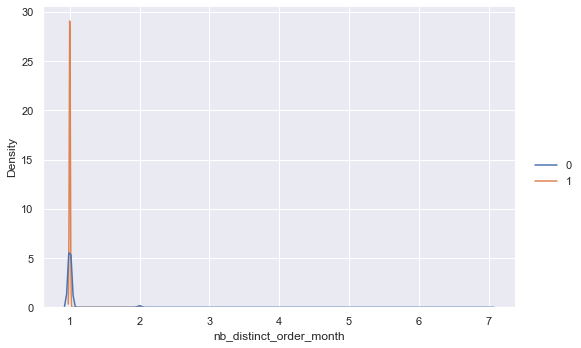

In [ ]:
for col in df_red.columns:
    plt.figure()
    sns.displot(data=df, x = col, kind='kde', hue=km2_1.labels_, height=5, aspect=1.5)
    plt.show()

<Figure size 432x288 with 0 Axes>

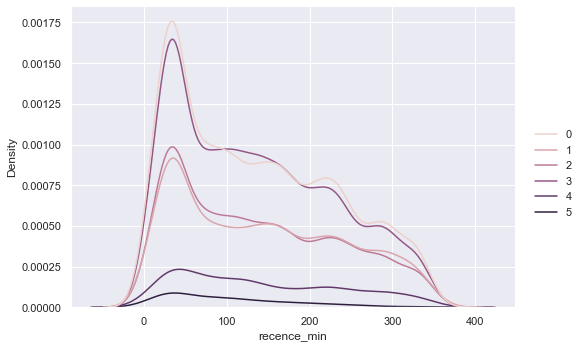

<Figure size 432x288 with 0 Axes>

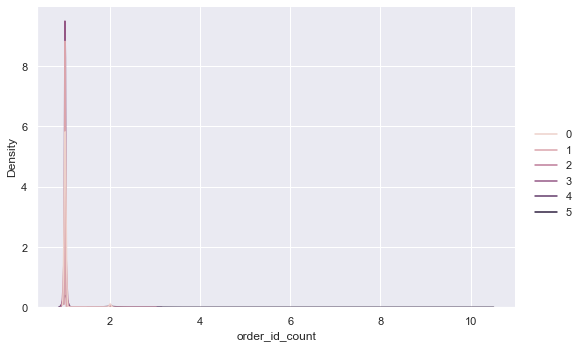

<Figure size 432x288 with 0 Axes>

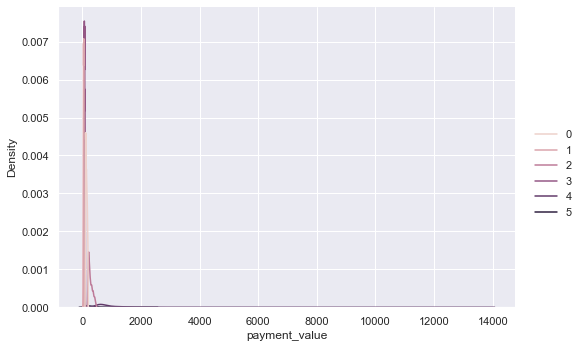

D:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


<Figure size 432x288 with 0 Axes>

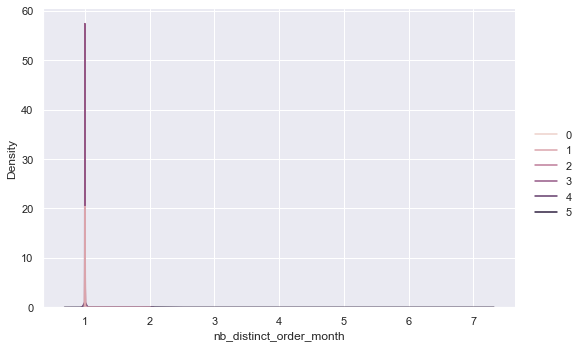

In [ ]:
for col in df_red.columns:
    plt.figure()
    sns.displot(data=df, x = col, kind='kde', hue=km6_1.labels_, height=5, aspect=1.5)
    plt.show()

#### /!\Fin abandon

In [ ]:
#7 clusters (kmeans) - Centroid displaying

In [72]:
#Clusterin with hdbscan

In [63]:
import hdbscan
hdb_clusterer = hdbscan.HDBSCAN(min_cluster_size=100, min_samples=100)
#hdb_clusterer = hdbscan.HDBSCAN()
hdb_clusterer.fit(df_red)

HDBSCAN(min_cluster_size=100, min_samples=100)

In [64]:
pd.Series(hdb_clusterer.labels_).value_counts()

 2    42365
-1      745
 0      417
 1      186
dtype: int64

In [65]:
hdb_clusterer.cluster_persistence_

array([0.01608892, 0.00262392, 0.18373265])

In [66]:
import hdbscan
hdb_clusterer1 = hdbscan.HDBSCAN(min_cluster_size=440, min_samples=100)
#hdb_clusterer = hdbscan.HDBSCAN()
hdb_clusterer1.fit(df_red_1)

HDBSCAN(min_cluster_size=440, min_samples=100)

In [85]:
pd.Series(hdb_clusterer1.labels_).value_counts()

 3    40635
-1     1248
 2      679
 1      608
 0      543
dtype: int64

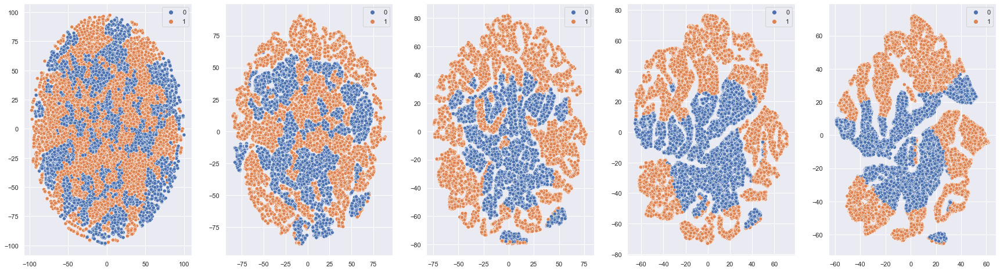

In [87]:
# 2 Clusters without recency
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= km2_1.labels_, ax = axes[0])
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= km2_1.labels_, ax = axes[1])
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= km2_1.labels_, ax = axes[2])
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= km2_1.labels_, ax = axes[3])
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= km2_1.labels_, ax = axes[4])
plt.show()

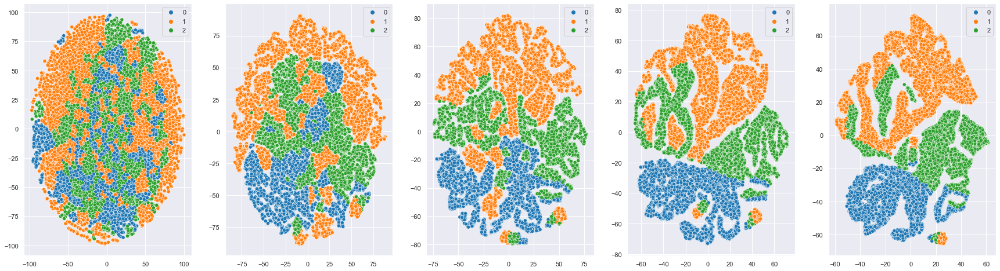

In [88]:
# 3 clusters with recency
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= km3.labels_, ax = axes[0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= km3.labels_, ax = axes[1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= km3.labels_, ax = axes[2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= km3.labels_, ax = axes[3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= km3.labels_, ax = axes[4], palette='tab10')
plt.show()

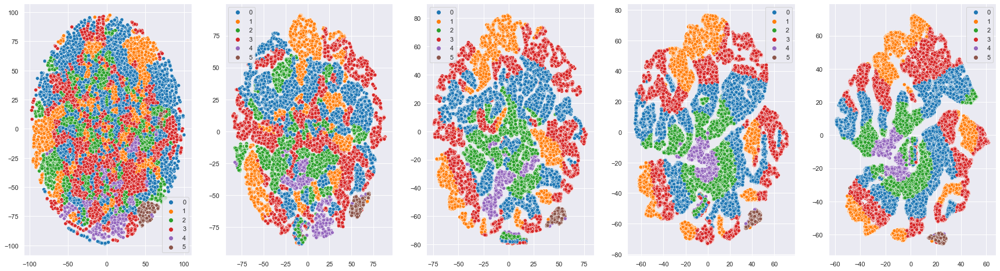

In [89]:
# 6 clusters without recency
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= km6_1.labels_, ax = axes[0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= km6_1.labels_, ax = axes[1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= km6_1.labels_, ax = axes[2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= km6_1.labels_, ax = axes[3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= km6_1.labels_, ax = axes[4], palette='tab10')
plt.show()

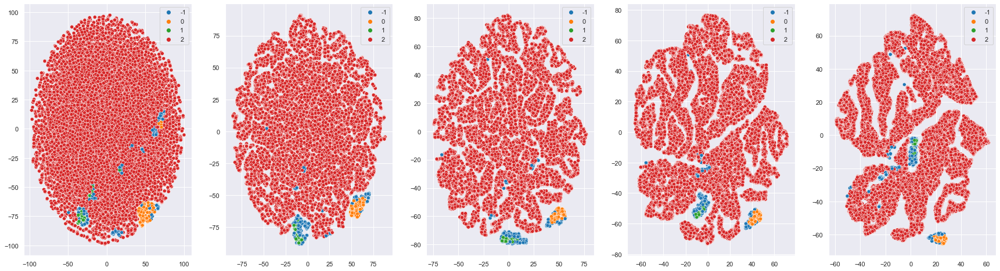

In [90]:
# With hdscan displaying
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= hdb_clusterer.labels_, ax = axes[0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= hdb_clusterer.labels_, ax = axes[1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= hdb_clusterer.labels_, ax = axes[2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= hdb_clusterer.labels_, ax = axes[3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= hdb_clusterer.labels_, ax = axes[4], palette='tab10')
plt.show()

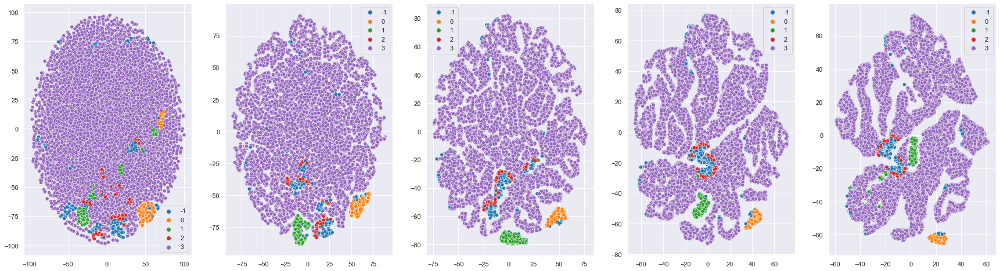

In [91]:
# With hdscan displaying without recency
fig, axes = plt.subplots(1,5,figsize=(30,8))
sns.scatterplot(x= X_embedded5[:,0], y = X_embedded5[:,1], hue= hdb_clusterer1.labels_, ax = axes[0], palette='tab10')
sns.scatterplot(x = X_embedded15[:,0], y = X_embedded15[:,1],hue= hdb_clusterer1.labels_, ax = axes[1], palette='tab10')
sns.scatterplot(x = X_embedded30[:,0], y = X_embedded30[:,1],hue= hdb_clusterer1.labels_, ax = axes[2], palette='tab10')
sns.scatterplot(x = X_embedded50[:,0], y = X_embedded50[:,1],hue= hdb_clusterer1.labels_, ax = axes[3], palette='tab10')
sns.scatterplot(x = X_embedded100[:,0], y = X_embedded100[:,1],hue= hdb_clusterer1.labels_, ax = axes[4], palette='tab10')
plt.show()

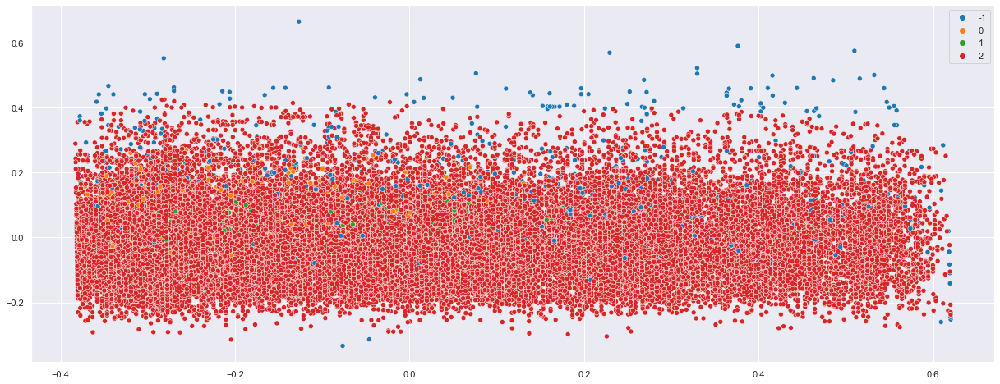

In [92]:
### Projection in first pca first plan
fig, axes = plt.subplots(figsize=(21,8))
sns.scatterplot(x= df_red_pca[:,0], y = df_red_pca[:,1], hue=hdb_clusterer.labels_, palette='tab10')
plt.show()

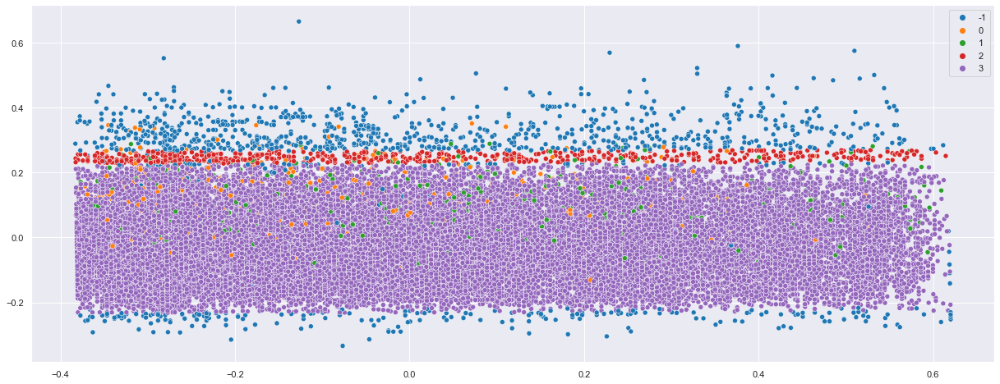

In [93]:
### Projection in first pca first plan
fig, axes = plt.subplots(figsize=(21,8))
sns.scatterplot(x= df_red_pca[:,0], y = df_red_pca[:,1], hue=hdb_clusterer1.labels_, palette='tab10')
plt.show()

In [94]:
# hdbscan sans la récence
df.pivot_table(index=hdb_clusterer1.labels_, values = df_red.columns, aggfunc='mean').T

,-1,0,1,2,3
nb_distinct_order_month,1.065705,2.000000,1.000000,1.000000,1.000000
order_id_count,1.163462,2.060773,2.000000,1.000000,1.000000
payment_value,1007.012973,284.292320,238.060493,664.517393,129.018721
recence_min,147.234776,99.528545,145.840461,133.251841,137.405143


In [95]:
df.pivot_table(index=km6_1.labels_, values = df_red.columns, aggfunc='mean').T

,0,1,2,3,4,5
nb_distinct_order_month,1.000000,1.000400,1.000000,1.000158,1.008740,2.023850
order_id_count,1.018352,1.001731,1.032166,1.005383,1.049218,2.212947
payment_value,136.841368,37.672990,275.315822,73.152775,901.835741,291.340647
recence_min,136.048051,142.839371,137.692538,135.874377,141.752530,101.136286


In [73]:
pd.DataFrame(pd.Series(hdb_clusterer1.labels_).value_counts(), columns=['Effectifs'])

,Effectifs
3,40635
-1,1248
2,679
1,608
0,543


In [81]:
pd.DataFrame(hdb_clusterer1.cluster_persistence_, index =[3,2,1,0])

,0
3,0.002717
2,0.005769
1,0.023227
0,0.141461


In [99]:
hdb_clusterer.cluster_persistence_

array([0.01608892, 0.00262392, 0.18373265])

In [67]:
# hdbscan avec la récence
df.pivot_table(index=hdb_clusterer.labels_, values = df_red.columns, aggfunc='mean').T

,-1,0,1,2
nb_distinct_order_month,1.279195,2.000000,1.000000,1.000000
order_id_count,2.033557,2.035971,2.000000,1.000000
payment_value,653.617342,256.980144,184.151667,156.293848
recence_min,173.779866,71.935252,87.322581,137.488375


In [68]:
pd.Series(hdb_clusterer.labels_).value_counts()

 2    42365
-1      745
 0      417
 1      186
dtype: int64